# Lab assignment 1: `Classification`
+ Ana Rotella Fernandez
+ Marta Simón Pinacho
+ Ana Miguélez Martínez

In [112]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
### Load necessary modules -------------------------------
# interactive plotting
%matplotlib inline
%config InlineBackend.figure_format = 'svg' # ‘png’, ‘retina’, ‘jpeg’, ‘svg’, ‘pdf’

# plotting libraries
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()

# Data management libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Machine learning libraries
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score


# Other
from mltools import classification_tools as CT
from mltools import model_tools as MT



## 1. Exploratory Data Analysis (EDA)

### STEP 1: IMPORT DATASET

In [2]:
### Load file --------------------------------------------
diabetes = pd.read_csv('Diabetes.csv', sep = ";")
diabetes

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


### STEP 2: CHECK OUT THE MISSING VALUES

In [3]:
### Info and type of variables & missing, veo cuantos valores non-null para todos los variables
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PREGNANT       768 non-null    int64  
 1   GLUCOSE        768 non-null    int64  
 2   BLOODPRESS     768 non-null    int64  
 3   SKINTHICKNESS  768 non-null    int64  
 4   INSULIN        768 non-null    int64  
 5   BODYMASSINDEX  768 non-null    float64
 6   PEDIGREEFUNC   768 non-null    float64
 7   AGE            768 non-null    int64  
 8   DIABETES       768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [4]:
# How many NAs?
print('Number of NAs in dataframe:',diabetes.isnull().values.sum()) 
diabetes.isnull().any() # Are there any NAs? No,there are not any NAs

Number of NAs in dataframe: 0


PREGNANT         False
GLUCOSE          False
BLOODPRESS       False
SKINTHICKNESS    False
INSULIN          False
BODYMASSINDEX    False
PEDIGREEFUNC     False
AGE              False
DIABETES         False
dtype: bool

### STEP 3: PLOT THE DATA AND CHECK OUT FOR OUTLIERS

In [5]:
diabetes.describe()

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


### `Functions to obtain outliers, drop outliers, generate histograms and boxplots for each variable`

In [6]:
# FUNCIÓN PARA OBTENER OUTLIERS
def outliers (datos):
    df_iqr = stats.iqr(datos)
    print(f"Rango intercuartílico: {df_iqr}")
    # Para localizar el primer y tercer cuartil.
    df_q1, df_q3 = np.quantile(datos, [0.25, 0.75])
 
    # Limites de los valores atípicos
    cut_low = df_q1 - 1.5 * df_iqr
    cut_high = df_q3 + 1.5 * df_iqr
 
    print("Lower and upper outlier limits:", cut_low, ", ", cut_high)
 
    # Obtenemos de nuestro dataset todos los valores atípicos segun los limites calculados
    df_outliers = diabetes.loc[(datos < cut_low) | (datos > cut_high)]

    # Representación mediante boxpots (sección gráficos)

    print('We have a total of', len(df_outliers), 'outliers')

    return df_outliers

In [7]:
# FUNCION PARA ELIMINAR OUTLIERS
def drop_outliers(df_outliers):
    df_outliers_index = df_outliers.index
    # ignoramos los errores para evitar borrar una misma fila (outliers en varias variables) dos veces
    diabetes_new.drop(index = df_outliers_index, inplace = True, errors='ignore')
    print("Outliers deleted.")

In [8]:
# FUNCIÓN PARA OBTENER UN BOXPLOT CON DIABETES=0 Y DIABETES=1
def boxplt (column, title, by=1):
    if by == 1:
        diabetes.plot.box(column=column, by = 'DIABETES')
    else:
        diabetes.plot.box(column=column)
    plt.xlabel('DIABETES', fontdict={'fontsize':20})
    plt.ylabel(column, fontdict={'fontsize':20})
    plt.title(title, fontdict={'fontsize':25})
    plt.show()

In [9]:
def hist_densplt(column, title):
    sns.set()
    dens_plot = sns.histplot(data = diabetes, x = column, kde=True)
    plt.title(title, fontdict={'fontsize':25})
    dens_plot.lines[0].set_color('red')
    dens_plot.lines[0].set_linewidth(3)

## PREGNANT

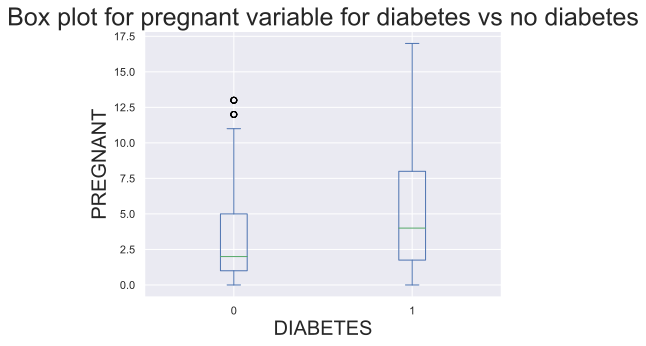

In [10]:
# Boxplot
pregnant_boxplt = boxplt('PREGNANT', 'Box plot for pregnant variable for diabetes vs no diabetes')

In [11]:
# Outliers
pregnant_outl = outliers(diabetes.PREGNANT)
pregnant_outl

Rango intercuartílico: 5.0
Lower and upper outlier limits: -6.5 ,  13.5
We have a total of 4 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
88,15,136,70,32,110,37.1,0.153,43,1
159,17,163,72,41,114,40.9,0.817,47,1
298,14,100,78,25,184,36.6,0.412,46,1
455,14,175,62,30,0,33.6,0.212,38,1


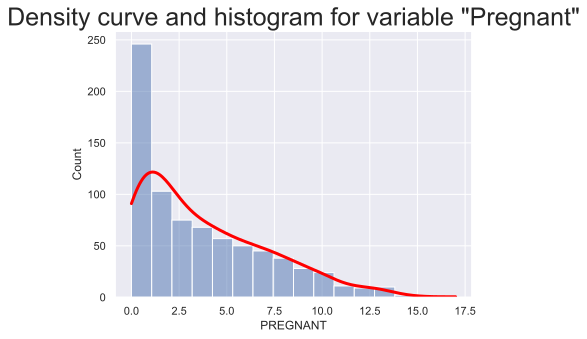

In [12]:
pregnant_histplt = hist_densplt('PREGNANT', 'Density curve and histogram for variable "Pregnant"')

**Conclusión de los outliers para PREGNANT**


La mayoría de los casos se dan en 0, 1 y 2 embarazos, como podemos ver en el histograma. 0 embarazos es normal, y 17 embarazos no es muy probable, pero también se puede dar el caso.


Al tratarse de valores que se pueden dar en casos reales, hemos decidido no eliminar o sustituir los outliers por otros valores.

## GLUCOSE

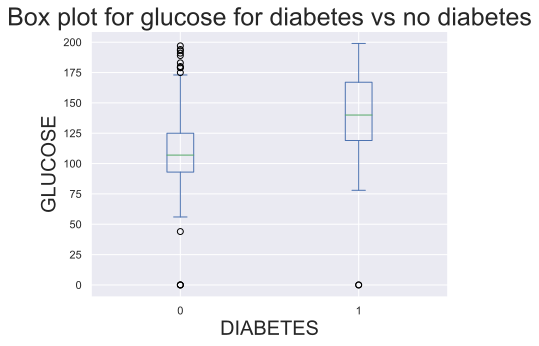

In [13]:
# Boxplot
glucose_boxplt = boxplt('GLUCOSE', 'Box plot for glucose for diabetes vs no diabetes')

In [14]:
# Outliers
glucose_outl = outliers(diabetes.GLUCOSE)
glucose_outl

Rango intercuartílico: 41.25
Lower and upper outlier limits: 37.125 ,  202.125
We have a total of 5 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
75,1,0,48,20,0,24.7,0.140,22,0
182,1,0,74,20,23,27.7,0.299,21,0
342,1,0,68,35,0,32.0,0.389,22,0
349,5,0,80,32,0,41.0,0.346,37,1
502,6,0,68,41,0,39.0,0.727,41,1


El bajo nivel de azúcar en la sangre grave es una emergencia médica. Puede ocasionar crisis epilépticas y daño cerebral.
Al nivel de azúcar en la sangre por debajo de los 70 mg/dL se lo considera bajo.

Por lo que en esta variable hemos decidido eliminar los outliers, ya que un valor de glucosa igual a 0 es imposible.

## BLOODPRESS

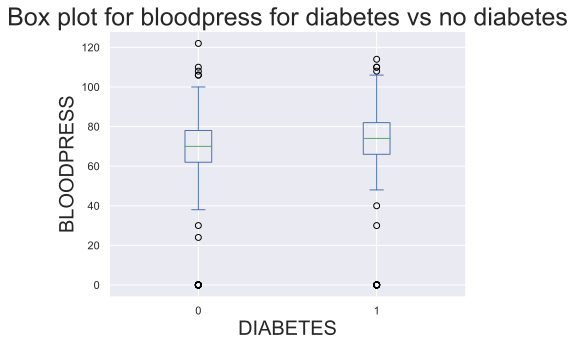

In [15]:
# Boxplot
bloodpress_boxplt = boxplt('BLOODPRESS', 'Box plot for bloodpress for diabetes vs no diabetes')

In [16]:
# Outliers
bloodpress_outl = outliers(diabetes.BLOODPRESS)
bloodpress_outl

Rango intercuartílico: 18.0
Lower and upper outlier limits: 35.0 ,  107.0
We have a total of 45 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
7,10,115,0,0,0,35.3,0.134,29,0
15,7,100,0,0,0,30.0,0.484,32,1
18,1,103,30,38,83,43.3,0.183,33,0
43,9,171,110,24,240,45.4,0.721,54,1
49,7,105,0,0,0,0.0,0.305,24,0
60,2,84,0,0,0,0.0,0.304,21,0
78,0,131,0,0,0,43.2,0.270,26,1
81,2,74,0,0,0,0.0,0.102,22,0
84,5,137,108,0,0,48.8,0.227,37,1
106,1,96,122,0,0,22.4,0.207,27,0


En la variable `BLOODPRESS` el mínimo es 0, esto significa que la presión arterial demasiado baja, lo que puede provocar la disminución de los niveles de oxígeno del cuerpo y provocar daño al corazón y al cerebro. 

Por otra parte, el máximo de presión arterial es 122, se considera una presión arterial alta en torno a 80 en adelante.

Por ambas razones, hemos decidido eliminar los outliers en esta variable.

## BODYMASSINDEX

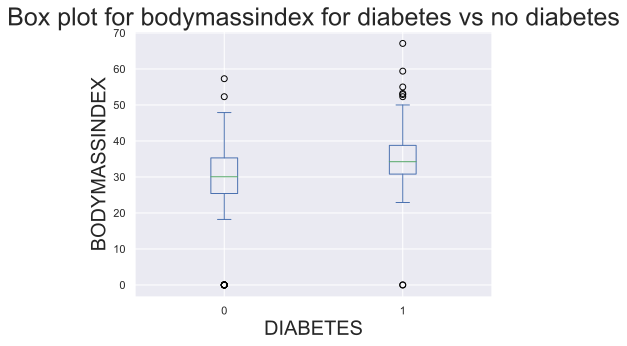

In [17]:
# Boxplot
bodymassindex_boxplt = boxplt('BODYMASSINDEX', 'Box plot for bodymassindex for diabetes vs no diabetes')

In [18]:
# Outliers
bodymassindex_outl = outliers(diabetes.BODYMASSINDEX)
bodymassindex_outl

Rango intercuartílico: 9.3
Lower and upper outlier limits: 13.35 ,  50.550000000000004
We have a total of 19 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
9,8,125,96,0,0,0.0,0.232,54,1
49,7,105,0,0,0,0.0,0.305,24,0
60,2,84,0,0,0,0.0,0.304,21,0
81,2,74,0,0,0,0.0,0.102,22,0
120,0,162,76,56,100,53.2,0.759,25,1
125,1,88,30,42,99,55.0,0.496,26,1
145,0,102,75,23,0,0.0,0.572,21,0
177,0,129,110,46,130,67.1,0.319,26,1
193,11,135,0,0,0,52.3,0.578,40,1
247,0,165,90,33,680,52.3,0.427,23,0


La variable `BODYMASSINDEX` indica el índice de masa corporal, que se mide teniendo en cuenta el peso y la altura de cada persona. 

Hay 11 casos en los que el `BODYMASSINDEX` es igual a 0, esto significaría que la persona carecería de masa corporal, lo cual es imposible. 

Por ambas razones, hemos decidido eliminar los outliers.

## INSULIN

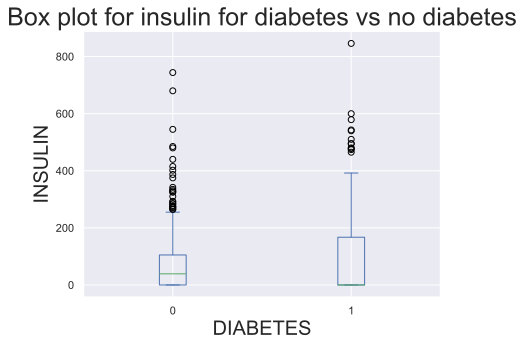

In [19]:
# Boxplot
insulin_boxplt = boxplt('INSULIN', 'Box plot for insulin for diabetes vs no diabetes')

In [20]:
# Outliers
insulin_outl = outliers(diabetes.INSULIN)
insulin_outl

Rango intercuartílico: 127.25
Lower and upper outlier limits: -190.875 ,  318.125
We have a total of 34 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
8,2,197,70,45,543,30.5,0.158,53,1
13,1,189,60,23,846,30.1,0.398,59,1
54,7,150,66,42,342,34.7,0.718,42,0
111,8,155,62,26,495,34.0,0.543,46,1
139,5,105,72,29,325,36.9,0.159,28,0
153,1,153,82,42,485,40.6,0.687,23,0
186,8,181,68,36,495,30.1,0.615,60,1
220,0,177,60,29,478,34.6,1.072,21,1
228,4,197,70,39,744,36.7,2.329,31,0
231,6,134,80,37,370,46.2,0.238,46,1


La variable `INSULINA`, lo normal es que sea de 5-26 U/ml. Por lo que en la gráfica de insulina es normal que haya tantos "outliers" alrededor del 0. 

## SKINTHICKNESS

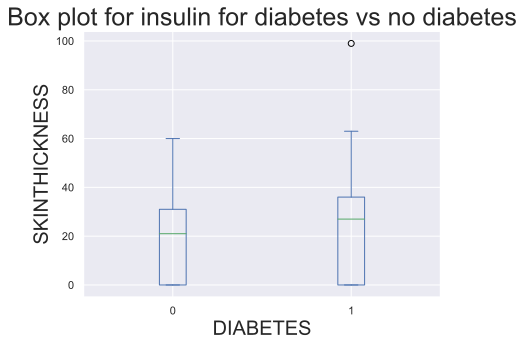

In [21]:
# Boxplot
skinthickness_boxplt = boxplt('SKINTHICKNESS', 'Box plot for insulin for diabetes vs no diabetes')

In [22]:
# Outliers
skinthickness_outl = outliers(diabetes.SKINTHICKNESS)
skinthickness_outl

Rango intercuartílico: 32.0
Lower and upper outlier limits: -48.0 ,  80.0
We have a total of 1 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
579,2,197,70,99,0,34.7,0.575,62,1


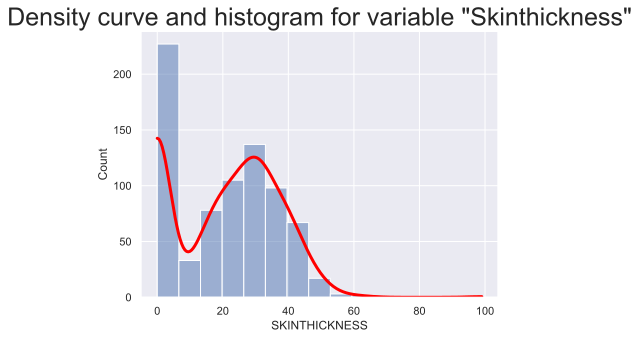

In [23]:
skinthickness_histplt = hist_densplt('SKINTHICKNESS', 'Density curve and histogram for variable "Skinthickness"')

Para esta variable, vemos en las gráficas que tenemos un gran número de ceros. Esta medida no es un valor normal para medir el valor del grosor de la piel, por lo que suponemos que son medidas que no se tomaron en el momento de analizar al paciente.

## PEDIGREEFUNC

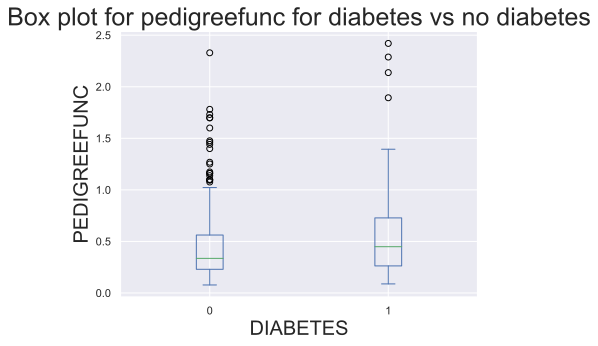

In [24]:
# Boxplot
pedigreefunc_boxplt = boxplt('PEDIGREEFUNC', 'Box plot for pedigreefunc for diabetes vs no diabetes')

In [25]:
# Outliers
pedigreefunc_outl = outliers(diabetes.PEDIGREEFUNC)
pedigreefunc_outl

Rango intercuartílico: 0.38249999999999995
Lower and upper outlier limits: -0.32999999999999996 ,  1.2
We have a total of 29 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
4,0,137,40,35,168,43.1,2.288,33,1
12,10,139,80,0,0,27.1,1.441,57,0
39,4,111,72,47,207,37.1,1.390,56,1
45,0,180,66,39,0,42.0,1.893,25,1
58,0,146,82,0,0,40.5,1.781,44,0
100,1,163,72,0,0,39.0,1.222,33,1
147,2,106,64,35,119,30.5,1.400,34,0
187,1,128,98,41,58,32.0,1.321,33,1
218,5,85,74,22,0,29.0,1.224,32,1
228,4,197,70,39,744,36.7,2.329,31,0


Para esta variable `PEDIGREEFUNC`, la cual nos indica lo relacion que tiene a nivel genetico con la diabetes, cuanto mayor es el valor mas alta es la relación con la patología. Por lo que en este caso los outliers hemos decidio no quitarlos.

## AGE

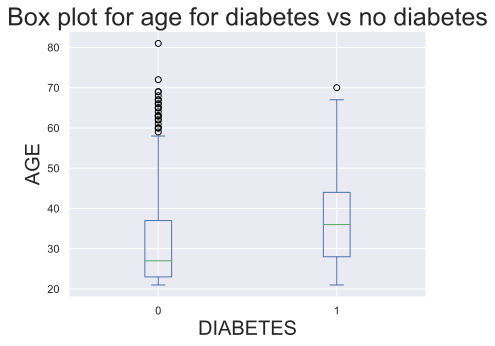

In [26]:
# Boxplot
age_boxplt = boxplt('AGE', 'Box plot for age for diabetes vs no diabetes')

In [27]:
# Outliers
age_outl = outliers(diabetes.AGE)
age_outl

Rango intercuartílico: 17.0
Lower and upper outlier limits: -1.5 ,  66.5
We have a total of 9 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
123,5,132,80,0,0,26.8,0.186,69,0
363,4,146,78,0,0,38.5,0.520,67,1
453,2,119,0,0,0,19.6,0.832,72,0
459,9,134,74,33,60,25.9,0.460,81,0
489,8,194,80,0,0,26.1,0.551,67,0
537,0,57,60,0,0,21.7,0.735,67,0
666,4,145,82,18,0,32.5,0.235,70,1
674,8,91,82,0,0,35.6,0.587,68,0
684,5,136,82,0,0,0.0,0.640,69,0


Para esta variable `AGE`,la cual indica la edad de lsa mujeres a partir de las cuales se ha desarrollado el dataset, como todas tienes mas de 21 años, no hemos eliminado los outliers, ya que todas las observaciones estan hechas a mujeres mayores de 21 años

### STEP 4: ENCODE CATEGORICAL VARIABLES

In [28]:
#There are no categorical input variables, but 'DIABETES' would be a categorical value.
### Convert output variable to factor, in this case 'DIABETES' is a categorical variable.
diabetes.DIABETES = diabetes.DIABETES.astype('category') 
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   PREGNANT       768 non-null    int64   
 1   GLUCOSE        768 non-null    int64   
 2   BLOODPRESS     768 non-null    int64   
 3   SKINTHICKNESS  768 non-null    int64   
 4   INSULIN        768 non-null    int64   
 5   BODYMASSINDEX  768 non-null    float64 
 6   PEDIGREEFUNC   768 non-null    float64 
 7   AGE            768 non-null    int64   
 8   DIABETES       768 non-null    category
dtypes: category(1), float64(2), int64(6)
memory usage: 49.0 KB


### STEP 5: EXPLORATORY ANALYSIS
Correlation plot of numeric variables

In [29]:
# Scatterplot all vs all
sns.pairplot(diabetes, hue = 'DIABETES')
plt.show()

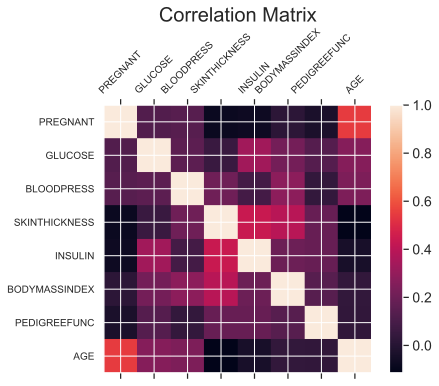

In [30]:
### Exploratory analysis -------------------------------------------------------------------------------------
#correlation plot of numeric variables
#Lo que nos interesa es tener variables que sean muy diferentes entre ellas.
f = plt.figure()
plt.matshow(diabetes.select_dtypes(include=['int64','float64']).corr(), fignum=f.number)
plt.xticks(range(diabetes.select_dtypes(include=['int64','float64']).shape[1]), diabetes.select_dtypes(include=['int64','float64']).columns, fontsize=10, rotation=45)
plt.yticks(range(diabetes.select_dtypes(include=['int64','float64']).shape[1]), diabetes.select_dtypes(include=['int64','float64']).columns, fontsize=10)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=20)
plt.show()

Una vez detectada la correlacion entre las variables y la importancia que tienen para el dataset (Cuanto más correladas estén entre ellas, menos informacion aportarán a nuestro modelo) podemos eliminar los outliers que hemos detectado anteriormente en las variables indicadas.

### STEP 6: CHECK OUT FOR CLASS IMBALANCES

In [31]:
# Class count -- vemos que está desbalanceado
diabetes.DIABETES.value_counts()

0    500
1    268
Name: DIABETES, dtype: int64

Como podemos ver en la tabla de frecuencias de la variable salida, hay muchos más registros de la clase 0 que de la clase 1, por lo que esta mso ante unos datos desbalanceados. 

Para balancear las clases, vamos a usar la librería **[imblearn](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html)**, en concreto, el método de oversampling llamado SMOTE. Este método genera datos sintéticos de la clase minoritaria, para obtener muestras similares a nuestros datos y conseguir balancear las clases del dataset.

<img src='./fig/imblearn_example.png' style= 'width:300mm'>


In [32]:
# import library
from imblearn.over_sampling import SMOTE
smote = SMOTE()

x = diabetes.loc[:, diabetes.columns != 'DIABETES']
y = diabetes.DIABETES

# fit predictor and target variable
x_smote, y_smote = smote.fit_resample(x, y)
print('Original dataset shape', len(y))
print('Resample dataset shape', len(y_smote))
diabetes_new = x_smote
diabetes_new['DIABETES']=y_smote

# Comprobamos que las métricas de las variables numéricas se mantienen 
#aproximadamente similares tras el oversampling
diabetes_new.describe()

Original dataset shape 768
Resample dataset shape 1000


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,3.887000,125.411000,69.422000,20.873000,85.56800,32.706768,0.482916,33.813000
std,3.274592,32.717128,19.581812,16.078165,121.65524,7.433491,0.315718,11.316452
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.078000,21.000000
25%,1.000000,102.000000,64.000000,0.000000,0.00000,28.400000,0.258000,25.000000
50%,3.000000,122.000000,72.000000,24.000000,34.00000,32.847002,0.402000,31.000000
75%,6.000000,146.000000,80.000000,33.000000,140.00000,37.025000,0.630250,41.000000
max,17.000000,199.000000,122.000000,99.000000,846.00000,67.100000,2.420000,81.000000


In [33]:
# Eliminamos los outliers de BMI
drop_outliers(bodymassindex_outl)

Outliers deleted.


In [34]:
# Eliminamos los outliers de Bloodpress
drop_outliers(bloodpress_outl)

Outliers deleted.


In [35]:
# Eliminamos los outliers de Skinthickness
drop_outliers(skinthickness_outl)

Outliers deleted.


In [36]:
# Eliminamos los outliers de Glucose
drop_outliers(glucose_outl)

Outliers deleted.


In [37]:
# Class count -- vemos que está desbalanceado
diabetes_new.DIABETES.value_counts()

1    472
0    468
Name: DIABETES, dtype: int64

**TO DO** : Comentar que las metricas son muy parecidas entre ellas, por lo que el dataset ha variado muy poco

### STEP 7: Split the `dataset ` into train and test 

In [130]:
# Define input and output matrices
INPUTS = ['PREGNANT','GLUCOSE','BLOODPRESS','SKINTHICKNESS','INSULIN','BODYMASSINDEX','PEDIGREEFUNC','AGE']
OUTPUT = 'DIABETES'
X = diabetes[INPUTS]
y = diabetes[OUTPUT]

X_new = diabetes_new[INPUTS]
y_new = diabetes_new[OUTPUT]

# Split original dataset 
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,  #percentage of test data 20%
                                                    random_state=0, #seed for replication, es para que me salga la =
                                                    stratify = y)   #Preserves distribution of y

# Split  modificated dataset
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new,
                                                    test_size=0.2,  #percentage of test data 20%
                                                    random_state=0, #seed for replication, es para que me salga la =
                                                    stratify = y_new)   #Preserves distribution of y

In [131]:
## Create dataset to store model predictions for original dataset
dfTR_eval = X_train.copy()
dfTR_eval['Y'] = y_train # We will call Y as output variable for simplicity
dfTS_eval = X_test.copy()
dfTS_eval['Y'] = y_test # We will call Y as output variable for simplicity>

In [132]:
## Create dataset to store model predictions for modificated dataset
dfTR_eval_new = X_train_new.copy()
dfTR_eval_new['Y'] = y_train_new # We will call Y as output variable for simplicity
dfTS_eval_new = X_test_new.copy()
dfTS_eval_new['Y'] = y_test_new # We will call Y as output variable for simplicity>

## 2. Training of Machine Learning models

Vamos a comenzar generando un árbol de decisión, para que nos detecte las variables más significativas de nuestro modelo y podamos hacer pruebas con varias de ellas.

Para este paso, vamos a hacer pruebas con los dos datasets que tenemos:
+ El dataset original, con todos los datos con outliers y desbalanceo de clases
+ El dataset preparado, sin outliers y con clases balanceadas

 ### 2.1.- Decision Trees

- [DecisionTreeClassifier()](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)
- [Wikipedia](https://en.wikipedia.org/wiki/Decision_tree)

 ### 2.1.1- `TEST WITH THE ORIGINAL DATASET`

In [41]:
#-------------------------------------------------------------------------------------------------
#---------------------------- DECISION TREE MODEL ------------------------------------------------
#-------------------------------------------------------------------------------------------------
## Inputs of the model. Change accordingly to perform variable selection

INPUTS_DT = INPUTS

param = {'DT__min_impurity_decrease': np.arange(0,0.05,0.005)} # Minimum entropy to decrease in each split. Valor que vamos a usar para la validación cruzada. Los porcentajes de mejora varían en funcion del problema
pipe = Pipeline(steps=[('scaler', StandardScaler()), 
                       ('DT', DecisionTreeClassifier(criterion='gini',  # impuriry measure
                                                     min_samples_split=5, # Minimum number of obs in node to keep cutting. minimo numero de muestras en un split
                                                     min_samples_leaf=5, # Minimum number of obs in a terminal node. minimo numero de muestras en un nodo terminal.
                                                     random_state=200))]) # For replication

# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10

# el arbol lo vamos a obtener mediante grid search
tree_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='accuracy', # Accuracy https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
tree_fit.fit(X_train[INPUTS_DT], y_train) # Search in grid


GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('DT',
                                        DecisionTreeClassifier(min_samples_leaf=5,
                                                               min_samples_split=5,
                                                               random_state=200))]),
             n_jobs=-1,
             param_grid={'DT__min_impurity_decrease': array([0.   , 0.005, 0.01 , 0.015, 0.02 , 0.025, 0.03 , 0.035, 0.04 ,
       0.045])},
             scoring='accuracy')

**FALTA INDICAR EL POR QUÉ DE LOS PARÁMETROS**

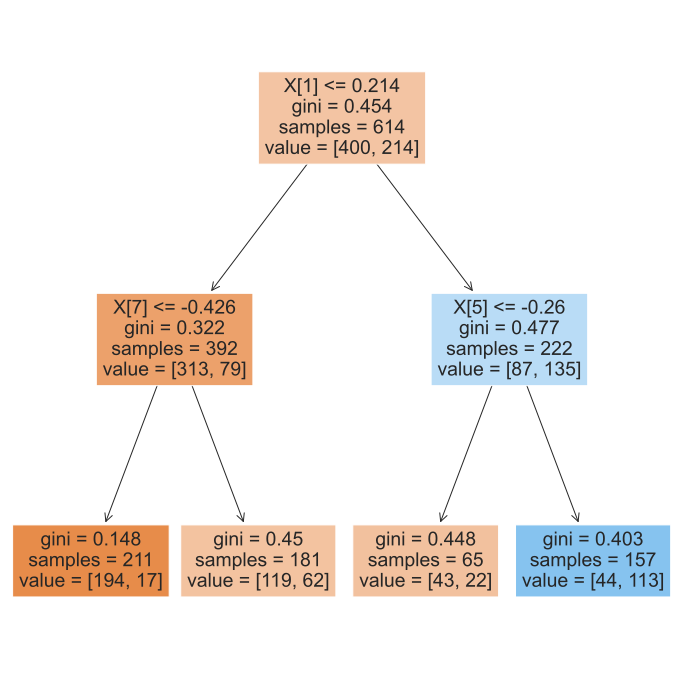

In [43]:
## Plot the decision tree model
plt.figure(figsize=(12, 12))
plot_tree(tree_fit.best_estimator_['DT'], filled=True)
plt.show()

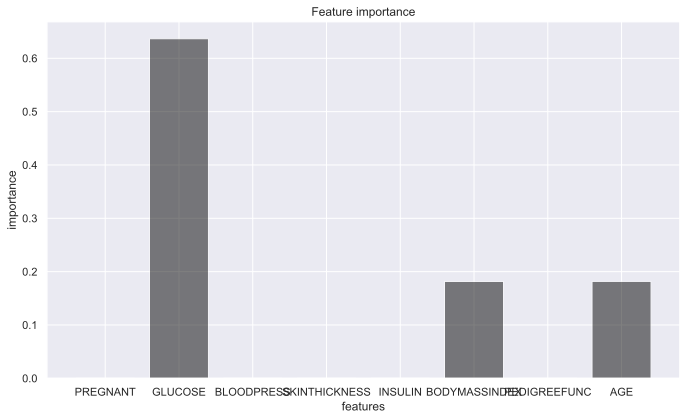

In [44]:
## Plot the variable importance of each feature
plt.figure(figsize=(6 * 1.618, 6))
index = np.arange(len(X_train[INPUTS_DT].columns))
bar_width = 0.35
plt.bar(index, tree_fit.best_estimator_['DT'].feature_importances_, color='black', alpha=0.5)
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Feature importance')
plt.xticks(index, X_train[INPUTS_DT].columns)
plt.tight_layout()
plt.show()

In [45]:
##  Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval['Y_DT_pred'] = tree_fit.predict(X_train[INPUTS_DT])
dfTR_eval['Y_DT_prob_neg'] = tree_fit.predict_proba(X_train[INPUTS_DT])[:,0]
dfTR_eval['Y_DT_prob_pos'] = tree_fit.predict_proba(X_train[INPUTS_DT])[:,1]

### Scale test using preprocess in training
dfTS_eval['Y_DT_pred'] = tree_fit.predict(X_test[INPUTS_DT])
dfTS_eval['Y_DT_prob_neg'] = tree_fit.predict_proba(X_test[INPUTS_DT])[:,0]
dfTS_eval['Y_DT_prob_pos'] = tree_fit.predict_proba(X_test[INPUTS_DT])[:,1]

#visualize evaluated data
dfTR_eval.head()

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,Y,Y_DT_pred,Y_DT_prob_neg,Y_DT_prob_pos
22,7,196,90,0,0,39.8,0.451,41,1,1,0.280255,0.719745
497,2,81,72,15,76,30.1,0.547,25,0,0,0.919431,0.080569
395,2,127,58,24,275,27.7,1.600,25,0,0,0.919431,0.080569
381,0,105,68,22,0,20.0,0.236,22,0,0,0.919431,0.080569
258,1,193,50,16,375,25.9,0.655,24,0,0,0.661538,0.338462


In [46]:
CT.confusion_matrix(dfTR_eval['Y'], dfTR_eval['Y_DT_pred'], labels=[0,1])

Confusion Matrix and Statistics
	   Prediction
 Reference   0   1
         0 356  44
         1 101 113

Accuracy: 0.76
No Information Rate: 0.57
P-Value [Acc > NIR]: 0.0
Kappa: 0.45
Mcnemar's Test P-Value: 0.0
Sensitivity: 0.53
Specificity: 0.89
Pos pred value: 0.72
Neg pred value: 0.78
Prevalence: 0.35
Detection Rate: 0.18
Detection prevalence: 0.26
Balanced accuracy: 0.71
F Score: 0.61
Positive class: 1


In [47]:
CT.confusion_matrix(dfTS_eval['Y'], dfTS_eval['Y_DT_pred'], labels=[0,1])

Confusion Matrix and Statistics
	   Prediction
 Reference  0  1
         0 87 13
         1 17 37

Accuracy: 0.81
No Information Rate: 0.55
P-Value [Acc > NIR]: 0.0
Kappa: 0.56
Mcnemar's Test P-Value: 0.58
Sensitivity: 0.69
Specificity: 0.87
Pos pred value: 0.74
Neg pred value: 0.84
Prevalence: 0.35
Detection Rate: 0.24
Detection prevalence: 0.32
Balanced accuracy: 0.78
F Score: 0.71
Positive class: 1


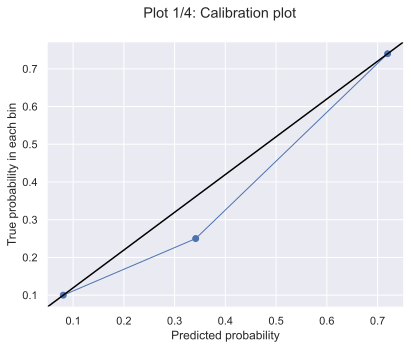

/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


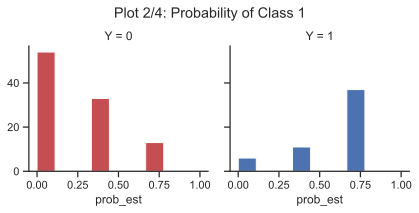

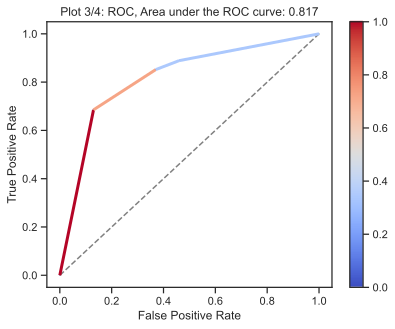

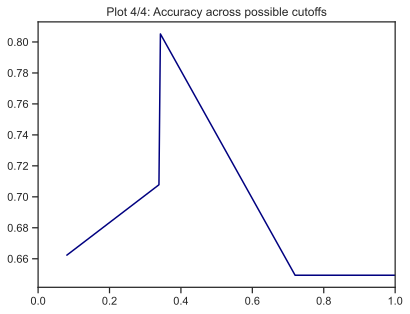

In [48]:

CT.plotClassPerformance(dfTS_eval['Y'], tree_fit.predict_proba(X_test[INPUTS_DT]), selClass=1)

**TO DO** COMENTAR LOS RESULTADOS DE ESTO

 ### 2.1.1- `TEST WITH MODIFICATED DATASET`

In [49]:
#-------------------------------------------------------------------------------------------------
#---------------------------- DECISION TREE MODEL ------------------------------------------------
#-------------------------------------------------------------------------------------------------
## Inputs of the model. Change accordingly to perform variable selection

INPUTS_DT = INPUTS

param = {'DT__min_impurity_decrease': np.arange(0,0.05,0.005)} # Minimum entropy to decrease in each split. Valor que vamos a usar para la validación cruzada. Los porcentajes de mejora varían en funcion del problema
pipe = Pipeline(steps=[('scaler', StandardScaler()), 
                       ('DT', DecisionTreeClassifier(criterion='gini',  # impuriry measure
                                                     min_samples_split=5, # Minimum number of obs in node to keep cutting. minimo numero de muestras en un split
                                                     min_samples_leaf=5, # Minimum number of obs in a terminal node. minimo numero de muestras en un nodo terminal.
                                                     random_state=200))]) # For replication

# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10

# el arbol lo vamos a obtener mediante grid search
tree_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='accuracy', # Accuracy https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 

tree_fit.fit(X_train_new[INPUTS_DT], y_train_new) # Search in grid

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('DT',
                                        DecisionTreeClassifier(min_samples_leaf=5,
                                                               min_samples_split=5,
                                                               random_state=200))]),
             n_jobs=-1,
             param_grid={'DT__min_impurity_decrease': array([0.   , 0.005, 0.01 , 0.015, 0.02 , 0.025, 0.03 , 0.035, 0.04 ,
       0.045])},
             scoring='accuracy')

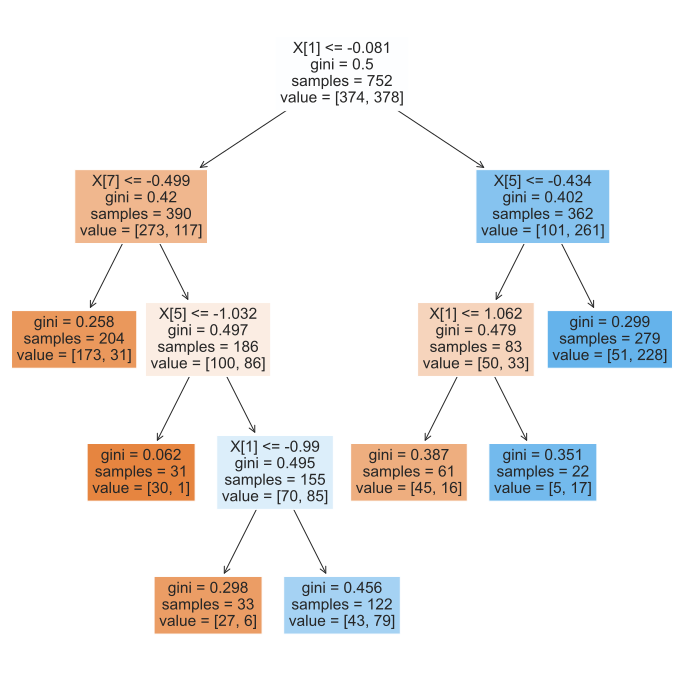

In [51]:
## Plot the decision tree model
plt.figure(figsize=(12, 12))
plot_tree(tree_fit.best_estimator_['DT'], filled=True)
plt.show()

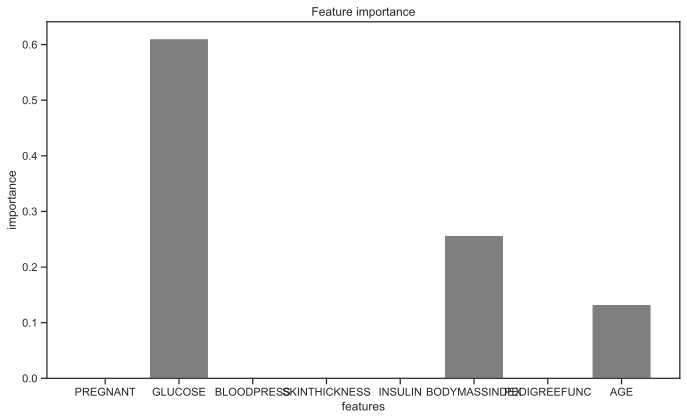

In [52]:
## Plot the variable importance of each feature
plt.figure(figsize=(6 * 1.618, 6))
index = np.arange(len(X_train_new[INPUTS_DT].columns))
bar_width = 0.35
plt.bar(index, tree_fit.best_estimator_['DT'].feature_importances_, color='black', alpha=0.5)
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Feature importance')
plt.xticks(index, X_train_new[INPUTS_DT].columns)
plt.tight_layout()
plt.show()

In [53]:
##  Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval_new['Y_DT_pred'] = tree_fit.predict(X_train_new[INPUTS_DT])
dfTR_eval_new['Y_DT_prob_neg'] = tree_fit.predict_proba(X_train_new[INPUTS_DT])[:,0]
dfTR_eval_new['Y_DT_prob_pos'] = tree_fit.predict_proba(X_train_new[INPUTS_DT])[:,1]

### Scale test using preprocess in training
dfTS_eval_new['Y_DT_pred'] = tree_fit.predict(X_test_new[INPUTS_DT])
dfTS_eval_new['Y_DT_prob_neg'] = tree_fit.predict_proba(X_test_new[INPUTS_DT])[:,0]
dfTS_eval_new['Y_DT_prob_pos'] = tree_fit.predict_proba(X_test_new[INPUTS_DT])[:,1]

#visualize evaluated data
dfTR_eval_new.head()

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,Y,Y_DT_pred,Y_DT_prob_neg,Y_DT_prob_pos
795,2,127,80,0,0,32.844832,0.471730,35,1,1,0.182796,0.817204
969,2,151,70,34,346,31.159702,0.339949,31,1,1,0.182796,0.817204
55,1,73,50,10,0,23.000000,0.248000,21,0,0,0.848039,0.151961
891,4,165,75,0,0,44.864060,0.450045,27,1,1,0.182796,0.817204
373,2,105,58,40,94,34.900000,0.225000,25,0,0,0.848039,0.151961


In [54]:
CT.confusion_matrix(dfTR_eval_new['Y'], dfTR_eval_new['Y_DT_pred'], labels=[0,1])

Confusion Matrix and Statistics
	   Prediction
 Reference   0   1
         0 275  99
         1  54 324

Accuracy: 0.8
No Information Rate: 0.5
P-Value [Acc > NIR]: 0.0
Kappa: 0.59
Mcnemar's Test P-Value: 0.0
Sensitivity: 0.86
Specificity: 0.74
Pos pred value: 0.77
Neg pred value: 0.84
Prevalence: 0.5
Detection Rate: 0.43
Detection prevalence: 0.56
Balanced accuracy: 0.8
F Score: 0.81
Positive class: 1


In [55]:
CT.confusion_matrix(dfTS_eval_new['Y'], dfTS_eval_new['Y_DT_pred'], labels=[0,1])

Confusion Matrix and Statistics
	   Prediction
 Reference  0  1
         0 62 32
         1 15 79

Accuracy: 0.75
No Information Rate: 0.5
P-Value [Acc > NIR]: 0.0
Kappa: 0.5
Mcnemar's Test P-Value: 0.02
Sensitivity: 0.84
Specificity: 0.66
Pos pred value: 0.71
Neg pred value: 0.81
Prevalence: 0.5
Detection Rate: 0.42
Detection prevalence: 0.59
Balanced accuracy: 0.75
F Score: 0.77
Positive class: 1


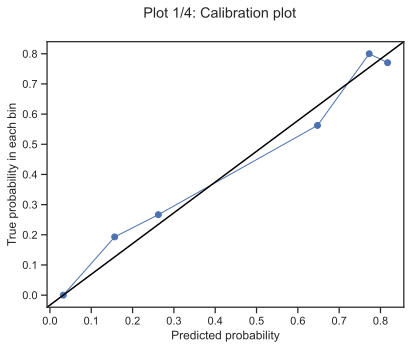

/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


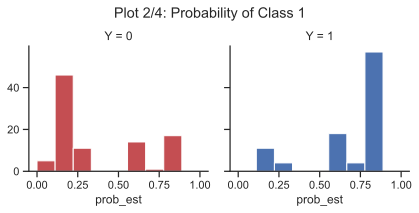

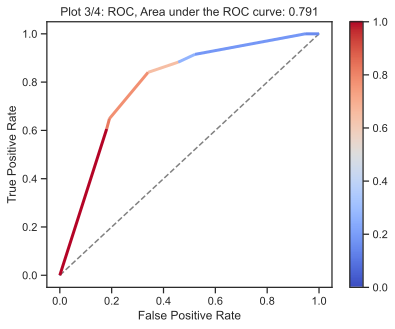

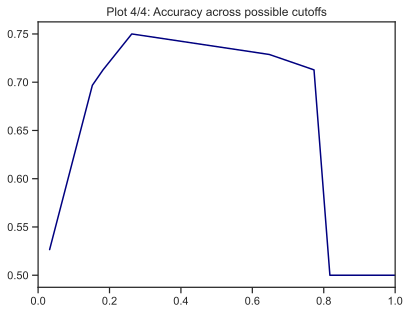

In [56]:
CT.plotClassPerformance(dfTS_eval_new['Y'], tree_fit.predict_proba(X_test_new[INPUTS_DT]), selClass=1)

**TO DO**: Comentar resultados


### 2.1 Random Forest 

- [RandomForestClassifier()](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)
- [Wikipedia](https://en.wikipedia.org/wiki/Random_forest)

 ### 3.1.1- `TEST WITH ORIGINAL DATASET`

In [133]:
## Inputs of the model. Change accordingly to perform variable selection
INPUTS = ['PREGNANT','GLUCOSE','BLOODPRESS','SKINTHICKNESS','INSULIN','BODYMASSINDEX','PEDIGREEFUNC','AGE']
INPUTS_RF = INPUTS

param = {'RF__n_estimators': range(10, 200, 10)} #Number of trees to grow
pipe = Pipeline(steps=[('scaler', StandardScaler()), 
                       ('RF', RandomForestClassifier(criterion='gini', # impuriry measure
                                                  max_features=len(X_train.columns),  # number of variables randomly sampled as candidates at each split.
                                                  min_samples_split=5,  # Minimum number of obs in node to keep cutting
                                                  min_samples_leaf=5, # Minimum number of obs in a terminal node
                                                  random_state=150))]) # For replication

# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
rf_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='accuracy', # Accuracy https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
rf_fit.fit(X_train[INPUTS_RF], y_train) # Search in grid

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('RF',
                                        RandomForestClassifier(max_features=8,
                                                               min_samples_leaf=5,
                                                               min_samples_split=5,
                                                               random_state=150))]),
             n_jobs=-1, param_grid={'RF__n_estimators': range(10, 200, 10)},
             scoring='accuracy')

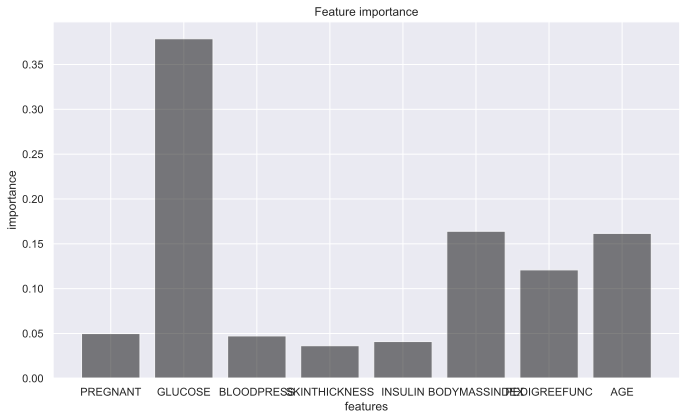

In [123]:
## Plot the variable importance of each feature
plt.figure(figsize=(6 * 1.618, 6))
index = np.arange(len(X_train[INPUTS_RF].columns))
bar_width = 0.35
plt.bar(index, rf_fit.best_estimator_['RF'].feature_importances_, color='black', alpha=0.5)
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Feature importance')
plt.xticks(index, X_train.columns)
plt.tight_layout()
plt.show()

In [135]:
## Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval['Y_RF_pred'] = rf_fit.predict(X_train[INPUTS_RF])
dfTR_eval['Y_RF_prob_neg'] = rf_fit.predict_proba(X_train[INPUTS_RF])[:,0]
dfTR_eval['Y_RF_prob_pos'] = rf_fit.predict_proba(X_train[INPUTS_RF])[:,1]
### Scale test using preprocess in training
dfTS_eval['Y_RF_pred'] = rf_fit.predict(X_test[INPUTS_RF])
dfTS_eval['Y_RF_prob_neg'] = rf_fit.predict_proba(X_test[INPUTS_RF])[:,0]
dfTS_eval['Y_RF_prob_pos'] = rf_fit.predict_proba(X_test[INPUTS_RF])[:,1]
dfTR_eval.head()

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,Y,Y_RF_pred,Y_RF_prob_neg,Y_RF_prob_pos
22,7,196,90,0,0,39.8,0.451,41,1,1,0.109603,0.890397
497,2,81,72,15,76,30.1,0.547,25,0,0,0.978571,0.021429
395,2,127,58,24,275,27.7,1.600,25,0,0,0.879076,0.120924
381,0,105,68,22,0,20.0,0.236,22,0,0,0.986111,0.013889
258,1,193,50,16,375,25.9,0.655,24,0,1,0.480690,0.519310


In [136]:
CT.confusion_matrix(dfTR_eval['Y'], dfTR_eval['Y_RF_pred'])

Confusion Matrix and Statistics
	   Prediction
 Reference   1   0
         1 175  39
         0  21 379

Accuracy: 0.9
No Information Rate: 0.55
P-Value [Acc > NIR]: 0.0
Kappa: 0.78
Mcnemar's Test P-Value: 0.03
Sensitivity: 0.95
Specificity: 0.82
Pos pred value: 0.91
Neg pred value: 0.89
Prevalence: 0.65
Detection Rate: 0.62
Detection prevalence: 0.68
Balanced accuracy: 0.88
F Score: 0.93
Positive class: 0


In [137]:
CT.confusion_matrix(dfTS_eval['Y'], dfTS_eval['Y_RF_pred'])

Confusion Matrix and Statistics
	   Prediction
 Reference  0  1
         0 89 11
         1 20 34

Accuracy: 0.8
No Information Rate: 0.56
P-Value [Acc > NIR]: 0.0
Kappa: 0.54
Mcnemar's Test P-Value: 0.15
Sensitivity: 0.63
Specificity: 0.89
Pos pred value: 0.76
Neg pred value: 0.82
Prevalence: 0.35
Detection Rate: 0.22
Detection prevalence: 0.29
Balanced accuracy: 0.76
F Score: 0.69
Positive class: 1


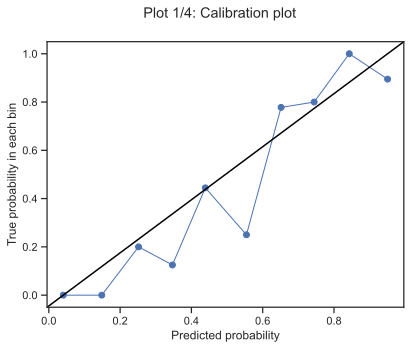

/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


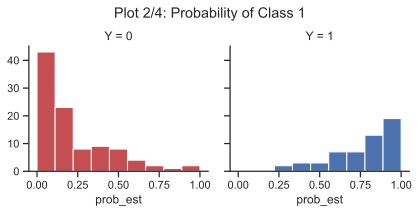

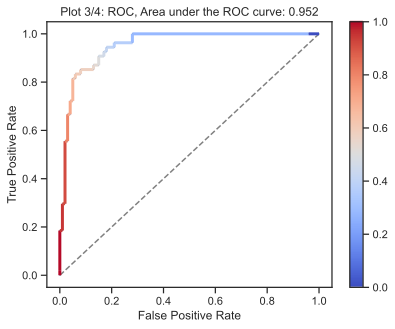

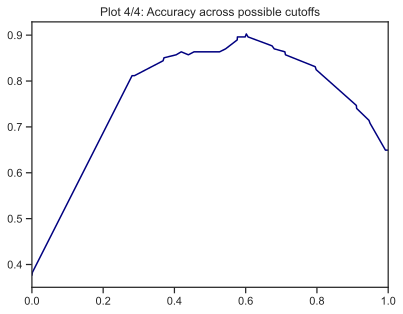

In [224]:
CT.plotClassPerformance(dfTS_eval['Y'], rf_fit.predict_proba(X_test[INPUTS_RF]), selClass=1)

 ### 3.1.1- `TEST WITH MODIFICATED DATASET`

In [227]:
## Inputs of the model. Change accordingly to perform variable selection
INPUTS_RF = INPUTS

param = {'RF__n_estimators': range(10, 200, 10)} #Number of trees to grow
pipe = Pipeline(steps=[('scaler', StandardScaler()), 
                       ('RF', RandomForestClassifier(criterion='gini', # impuriry measure
                                                  max_features=len(X_train_new.columns),  # number of variables randomly sampled as candidates at each split.
                                                  min_samples_split=5,  # Minimum number of obs in node to keep cutting
                                                  min_samples_leaf=5, # Minimum number of obs in a terminal node
                                                  random_state=150))]) # For replication

# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
rf_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='accuracy', # Accuracy https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
rf_fit.fit(X_train_new[INPUTS_RF], y_train_new) # Search in grid

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('RF',
                                        RandomForestClassifier(max_features=5,
                                                               min_samples_leaf=5,
                                                               min_samples_split=5,
                                                               random_state=150))]),
             n_jobs=-1, param_grid={'RF__n_estimators': range(10, 200, 10)},
             scoring='accuracy')

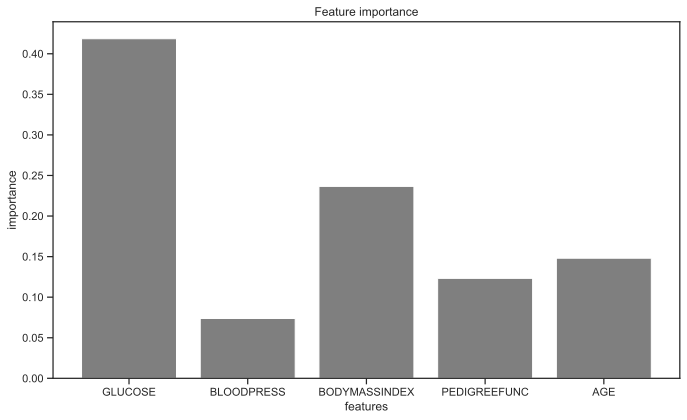

In [228]:
## Plot the variable importance of each feature
plt.figure(figsize=(6 * 1.618, 6))
index = np.arange(len(X_train_new[INPUTS_RF].columns))
bar_width = 0.35
plt.bar(index, rf_fit.best_estimator_['RF'].feature_importances_, color='black', alpha=0.5)
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Feature importance')
plt.xticks(index, X_train_new.columns)
plt.tight_layout()
plt.show()

In [231]:
## Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval_new['Y_RF_pred'] = rf_fit.predict(X_train_new[INPUTS_RF])
dfTR_eval_new['Y_RF_prob_neg'] = rf_fit.predict_proba(X_train_new[INPUTS_RF])[:,0]
dfTR_eval_new['Y_RF_prob_pos'] = rf_fit.predict_proba(X_train_new[INPUTS_RF])[:,1]
### Scale test using preprocess in training
dfTS_eval_new['Y_RF_pred'] = rf_fit.predict(X_test_new[INPUTS_RF])
dfTS_eval_new['Y_RF_prob_neg'] = rf_fit.predict_proba(X_test_new[INPUTS_RF])[:,0]
dfTS_eval_new['Y_RF_prob_pos'] = rf_fit.predict_proba(X_test_new[INPUTS_RF])[:,1]

In [232]:
CT.confusion_matrix(dfTR_eval_new['Y'], dfTR_eval_new['Y_RF_pred'])

Confusion Matrix and Statistics
	   Prediction
 Reference   1   0
         1 344  34
         0  48 326

Accuracy: 0.89
No Information Rate: 0.5
P-Value [Acc > NIR]: 0.0
Kappa: 0.78
Mcnemar's Test P-Value: 0.15
Sensitivity: 0.87
Specificity: 0.91
Pos pred value: 0.91
Neg pred value: 0.88
Prevalence: 0.5
Detection Rate: 0.43
Detection prevalence: 0.48
Balanced accuracy: 0.89
F Score: 0.89
Positive class: 0


In [233]:
CT.confusion_matrix(dfTS_eval_new['Y'], dfTS_eval_new['Y_RF_pred'])

Confusion Matrix and Statistics
	   Prediction
 Reference  0  1
         0 71 23
         1 15 79

Accuracy: 0.8
No Information Rate: 0.5
P-Value [Acc > NIR]: 0.0
Kappa: 0.6
Mcnemar's Test P-Value: 0.26
Sensitivity: 0.84
Specificity: 0.76
Pos pred value: 0.77
Neg pred value: 0.83
Prevalence: 0.5
Detection Rate: 0.42
Detection prevalence: 0.54
Balanced accuracy: 0.8
F Score: 0.81
Positive class: 1


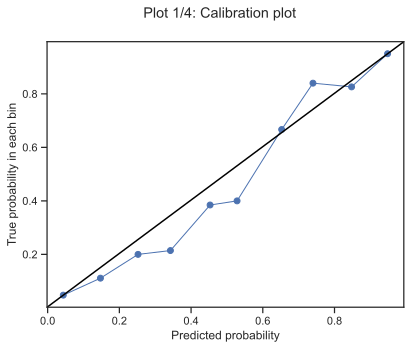

/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


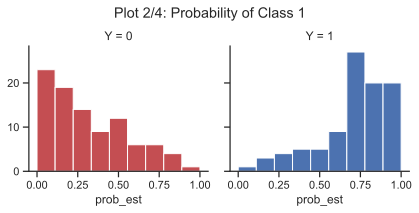

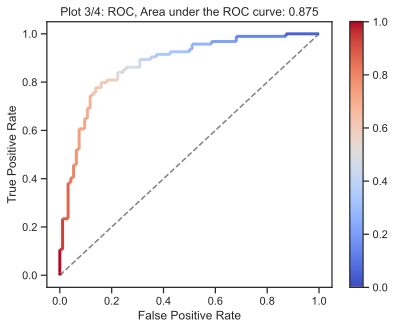

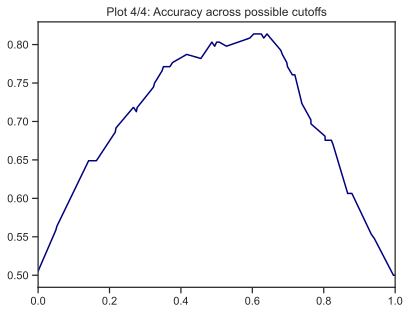

In [234]:
CT.plotClassPerformance(dfTS_eval_new['Y'], rf_fit.predict_proba(X_test_new[INPUTS_RF]), selClass=1)

### 3.1 Logistic Regression

- [LogisticRegression()](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html)
- [Wikipedia](https://en.wikipedia.org/wiki/Logistic_regression)

In [57]:
diabetes.shape ##EL ORIGINAL ES EL ORIGINAL

(768, 9)

 ### 3.1.1- `TEST WITH ORIGINAL DATASET`

In [158]:
## Inputs of the model. Change accordingly to perform variable selection
INPUTS_LR = INPUTS

#ModLogReg = LogisticRegression()
LogReg_fit = Pipeline(steps=[('scaler',StandardScaler()), # Preprocess the variables when training the model 
                        ('LogReg',LogisticRegression(random_state=5))]) # Model to use in the pipeline

#Es como una tuberia, lo primero que va a hacer es un 'scaler' es una funcion que me escala las variables
#Lo que hace es normalizarlo, le quita la media y lo divide entre la varianza

#Train model
LogReg_fit.fit(X_train[INPUTS_LR], y_train);

print("Logistic Regression Trained")

Logistic Regression Trained


In [159]:
# Obtain Cross-Validation score
print("CV accuracy is")
cross_val_score(LogReg_fit, X_train[INPUTS_LR], y_train, cv=10, scoring='accuracy').mean()

CV accuracy is


0.7671073506081438

In [160]:
#El p-valor es la ultima columna
CT.summaryLogReg(LogReg_fit, X_train[INPUTS_LR], y_train) #Esto te da los resultados de los que hablabamos en casa

Deviance Residuals:
        Min        1Q    Median        3Q       Max
0 -0.960377 -0.247754 -0.095737  0.268054  0.980029

Coefficients:
               Estimate
Intercept     -0.847913
PREGNANT       0.392084
GLUCOSE        0.986186
BLOODPRESS    -0.227106
SKINTHICKNESS -0.034883
INSULIN       -0.047038
BODYMASSINDEX  0.625000
PEDIGREEFUNC   0.306933
AGE            0.243356
               Estimate  Std. Err   t-value      Pr(>|t|) Signif
Intercept     -0.847913  0.105634 -8.026912  1.110223e-15    ***
PREGNANT       0.392084  0.116019  3.379468  7.262638e-04    ***
GLUCOSE        0.986186  0.127060  7.761575  8.437695e-15    ***
BLOODPRESS    -0.227106  0.110483 -2.055566  3.982434e-02      *
SKINTHICKNESS -0.034883  0.119559 -0.291765  7.704666e-01       
INSULIN       -0.047038  0.112906 -0.416610  6.769636e-01       
BODYMASSINDEX  0.625000  0.128958  4.846542  1.256320e-06    ***
PEDIGREEFUNC   0.306933  0.109628  2.799767  5.113945e-03     **
AGE            0.243356  0.118128  2

In [161]:
## Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval['Y_LR_pred'] = LogReg_fit.predict(X_train[INPUTS_LR])
dfTR_eval['Y_LR_prob_neg'] = LogReg_fit.predict_proba(X_train[INPUTS_LR])[:,0] #NO 
dfTR_eval['Y_LR_prob_pos'] = LogReg_fit.predict_proba(X_train[INPUTS_LR])[:,1] #YES
### Scale test using preprocess in training ---------------------------------------------
dfTS_eval['Y_LR_pred'] = LogReg_fit.predict(X_test)
dfTS_eval['Y_LR_prob_neg'] = LogReg_fit.predict_proba(X_test[INPUTS_LR])[:,0]
dfTS_eval['Y_LR_prob_pos'] = LogReg_fit.predict_proba(X_test[INPUTS_LR])[:,1]

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,Y,Y_RF_pred,Y_RF_prob_neg,Y_RF_prob_pos,Y_LR_pred,Y_LR_prob_neg,Y_LR_prob_pos
22,7,196,90,0,0,39.8,0.451,41,1,1,0.036791,0.963209,1,0.081142,0.918858
497,2,81,72,15,76,30.1,0.547,25,0,0,0.964973,0.035027,0,0.929741,0.070259
395,2,127,58,24,275,27.7,1.600,25,0,0,0.799983,0.200017,0,0.585737,0.414263
381,0,105,68,22,0,20.0,0.236,22,0,0,0.972144,0.027856,0,0.959552,0.040448
258,1,193,50,16,375,25.9,0.655,24,0,1,0.420716,0.579284,1,0.346448,0.653552


In [162]:
#Confusion matrix for Log Reg Model
print("----- TRAINING CONFUSION MATRIX -----")
CT.confusion_matrix(dfTR_eval['Y'], dfTR_eval['Y_LR_pred'], labels=[0,1])

----- TRAINING CONFUSION MATRIX -----
Confusion Matrix and Statistics
	   Prediction
 Reference   0   1
         0 356  44
         1  91 123

Accuracy: 0.78
No Information Rate: 0.57
P-Value [Acc > NIR]: 0.0
Kappa: 0.49
Mcnemar's Test P-Value: 0.0
Sensitivity: 0.57
Specificity: 0.89
Pos pred value: 0.74
Neg pred value: 0.8
Prevalence: 0.35
Detection Rate: 0.2
Detection prevalence: 0.27
Balanced accuracy: 0.73
F Score: 0.65
Positive class: 1


In [163]:
print("----- TEST CONFUSION MATRIX-----")
CT.confusion_matrix(dfTS_eval['Y'], dfTS_eval['Y_LR_pred'], labels=[0,1])

----- TEST CONFUSION MATRIX-----
Confusion Matrix and Statistics
	   Prediction
 Reference  0  1
         0 89 11
         1 23 31

Accuracy: 0.78
No Information Rate: 0.57
P-Value [Acc > NIR]: 0.0
Kappa: 0.49
Mcnemar's Test P-Value: 0.06
Sensitivity: 0.57
Specificity: 0.89
Pos pred value: 0.74
Neg pred value: 0.79
Prevalence: 0.35
Detection Rate: 0.2
Detection prevalence: 0.27
Balanced accuracy: 0.73
F Score: 0.65
Positive class: 1


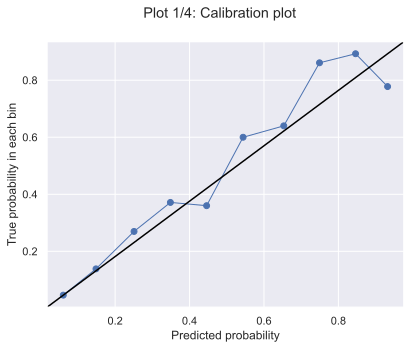

/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


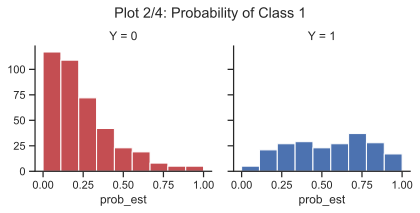

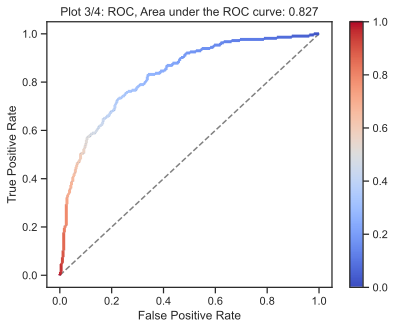

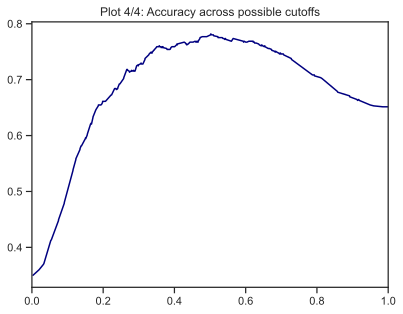

In [164]:
CT.plotClassPerformance(dfTR_eval['Y'], LogReg_fit.predict_proba(X_train[INPUTS_LR]), selClass=1)

#### LO QUE HE HECHO ES DEJAR SOLO LAS QUE SON MAS SIGNIFICANTES EN EL MODELO, PERO EL RESULTADO NO ES MUY BUENO
+ Lo que he hecho ha sido quitar las que no son importantes en el modelo anterior, que siguen mas o menos la misma dinamica que otros modelos

In [184]:
# Define input and output matrices
INPUTS = ['PREGNANT','GLUCOSE','BLOODPRESS','BODYMASSINDEX','PEDIGREEFUNC','AGE']
OUTPUT = 'DIABETES'

X = diabetes[INPUTS]
y = diabetes[OUTPUT]

# Split original dataset 
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,  #percentage of test data 20%
                                                    random_state=0, #seed for replication, es para que me salga la =
                                                    stratify = y)   #Preserves distribution of y

In [185]:
## Create dataset to store model predictions for original dataset
dfTR_eval = X_train.copy()
dfTR_eval['Y'] = y_train # We will call Y as output variable for simplicity
dfTS_eval = X_test.copy()
dfTS_eval['Y'] = y_test # We will call Y as output variable for simplicity>

In [186]:
## Inputs of the model. Change accordingly to perform variable selection
INPUTS_LR = INPUTS

#ModLogReg = LogisticRegression()
LogReg_fit = Pipeline(steps=[('scaler',StandardScaler()), # Preprocess the variables when training the model 
                        ('LogReg',LogisticRegression(random_state=5))]) # Model to use in the pipeline

#Es como una tuberia, lo primero que va a hacer es un 'scaler' es una funcion que me escala las variables
#Lo que hace es normalizarlo, le quita la media y lo divide entre la varianza

#Train model
LogReg_fit.fit(X_train[INPUTS_LR], y_train);

print("Logistic Regression Trained")

Logistic Regression Trained


In [187]:
# Obtain Cross-Validation score
print("CV accuracy is")
cross_val_score(LogReg_fit, X_train[INPUTS_LR], y_train, cv=10, scoring='accuracy').mean()

CV accuracy is


0.7638551031200425

In [188]:
## Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval['Y_LR_pred'] = LogReg_fit.predict(X_train[INPUTS_LR])
dfTR_eval['Y_LR_prob_neg'] = LogReg_fit.predict_proba(X_train[INPUTS_LR])[:,0] #NO 
dfTR_eval['Y_LR_prob_pos'] = LogReg_fit.predict_proba(X_train[INPUTS_LR])[:,1] #YES
### Scale test using preprocess in training ---------------------------------------------
dfTS_eval['Y_LR_pred'] = LogReg_fit.predict(X_test)
dfTS_eval['Y_LR_prob_neg'] = LogReg_fit.predict_proba(X_test[INPUTS_LR])[:,0]
dfTS_eval['Y_LR_prob_pos'] = LogReg_fit.predict_proba(X_test[INPUTS_LR])[:,1]

In [189]:
CT.summaryLogReg(LogReg_fit, X_train[INPUTS_LR], y_train) #Esto te da los resultados de los que hablabamos en casa

Deviance Residuals:
        Min        1Q    Median        3Q       Max
0 -0.967371 -0.247159 -0.095219  0.267933  0.979226

Coefficients:
               Estimate
Intercept     -0.847263
PREGNANT       0.395474
GLUCOSE        0.968993
BLOODPRESS    -0.233365
BODYMASSINDEX  0.604973
PEDIGREEFUNC   0.295759
AGE            0.252775
               Estimate  Std. Err   t-value      Pr(>|t|) Signif
Intercept     -0.847263  0.105562 -8.026243  1.110223e-15    ***
PREGNANT       0.395474  0.115953  3.410653  6.480743e-04    ***
GLUCOSE        0.968993  0.119872  8.083536  6.661338e-16    ***
BLOODPRESS    -0.233365  0.108851 -2.143893  3.204145e-02      *
BODYMASSINDEX  0.604973  0.121687  4.971560  6.641636e-07    ***
PEDIGREEFUNC   0.295759  0.108115  2.735606  6.226558e-03     **
AGE            0.252775  0.117374  2.153576  3.127344e-02      *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


In [190]:
print("----- TRAINING CONFUSION MATRIX -----")
CT.confusion_matrix(dfTR_eval['Y'], dfTR_eval['Y_LR_pred'], labels=[0,1])

----- TRAINING CONFUSION MATRIX -----
Confusion Matrix and Statistics
	   Prediction
 Reference   0   1
         0 356  44
         1  94 120

Accuracy: 0.78
No Information Rate: 0.57
P-Value [Acc > NIR]: 0.0
Kappa: 0.48
Mcnemar's Test P-Value: 0.0
Sensitivity: 0.56
Specificity: 0.89
Pos pred value: 0.73
Neg pred value: 0.79
Prevalence: 0.35
Detection Rate: 0.2
Detection prevalence: 0.27
Balanced accuracy: 0.73
F Score: 0.63
Positive class: 1


In [191]:
print("----- TEST CONFUSION MATRIX-----")
CT.confusion_matrix(dfTS_eval['Y'], dfTS_eval['Y_LR_pred'], labels=[0,1])

----- TEST CONFUSION MATRIX-----
Confusion Matrix and Statistics
	   Prediction
 Reference  0  1
         0 90 10
         1 24 30

Accuracy: 0.78
No Information Rate: 0.57
P-Value [Acc > NIR]: 0.0
Kappa: 0.48
Mcnemar's Test P-Value: 0.02
Sensitivity: 0.56
Specificity: 0.9
Pos pred value: 0.75
Neg pred value: 0.79
Prevalence: 0.35
Detection Rate: 0.19
Detection prevalence: 0.26
Balanced accuracy: 0.73
F Score: 0.64
Positive class: 1


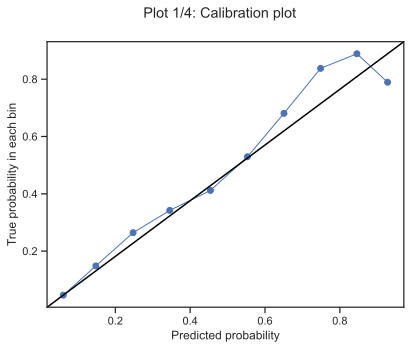

/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


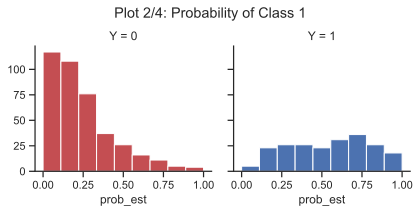

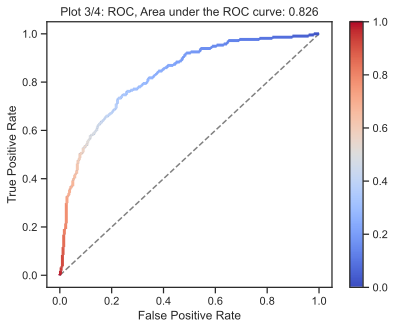

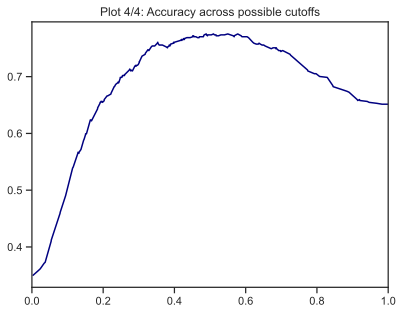

In [192]:
CT.plotClassPerformance(dfTR_eval['Y'], LogReg_fit.predict_proba(X_train[INPUTS_LR]), selClass=1)

 ### 3.1.1- `TEST WITH MODIFICATED DATASET`

In [194]:
diabetes_new.shape #GENIAL

(940, 9)

In [195]:
INPUTS = ['PREGNANT','GLUCOSE','BLOODPRESS','SKINTHICKNESS','INSULIN','BODYMASSINDEX','PEDIGREEFUNC','AGE']
OUTPUT = 'DIABETES'

X_new = diabetes_new[INPUTS]
y_new = diabetes_new[OUTPUT]


X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new,
                                                    test_size=0.2,  #percentage of test data 20%
                                                    random_state=0, #seed for replication, es para que me salga la =
                                                    stratify = y_new)   #Preserves distribution of y

In [196]:
## Create dataset to store model predictions for modificated dataset
dfTR_eval_new = X_train_new.copy()
dfTR_eval_new['Y'] = y_train_new # We will call Y as output variable for simplicity
dfTS_eval_new = X_test_new.copy()
dfTS_eval_new['Y'] = y_test_new # We will call Y as output variable for simplicity

In [197]:
## Inputs of the model. Change accordingly to perform variable selection
INPUTS_LR = INPUTS

#ModLogReg = LogisticRegression()
LogReg_fit = Pipeline(steps=[('scaler',StandardScaler()), # Preprocess the variables when training the model 
                        ('LogReg',LogisticRegression(random_state=5))]) # Model to use in the pipeline

LogReg_fit.fit(X_train_new[INPUTS_LR], y_train_new);

print("Logistic Regression Trained")

Logistic Regression Trained


In [198]:
# Obtain Cross-Validation score
print("CV accuracy is")
cross_val_score(LogReg_fit, X_train_new[INPUTS_LR], y_train_new, cv=10, scoring='accuracy').mean()

CV accuracy is


0.7420701754385965

In [199]:
CT.summaryLogReg(LogReg_fit, X_train_new[INPUTS_LR], y_train_new) #Esto te da los resultados de los que hablabamos en casa

Deviance Residuals:
        Min        1Q    Median        3Q       Max
0 -0.985208 -0.273335  0.016481  0.265898  0.970356

Coefficients:
               Estimate
Intercept      0.047866
PREGNANT       0.225061
GLUCOSE        1.130291
BLOODPRESS    -0.252452
SKINTHICKNESS -0.109942
INSULIN       -0.109155
BODYMASSINDEX  0.790532
PEDIGREEFUNC   0.270518
AGE            0.322089
               Estimate  Std. Err   t-value      Pr(>|t|) Signif
Intercept      0.047866  0.090410  0.529430  5.965071e-01       
PREGNANT       0.225061  0.106701  2.109272  3.492110e-02      *
GLUCOSE        1.130291  0.121495  9.303223  0.000000e+00    ***
BLOODPRESS    -0.252452  0.104577 -2.414019  1.577762e-02      *
SKINTHICKNESS -0.109942  0.110479 -0.995138  3.196693e-01       
INSULIN       -0.109155  0.116875 -0.933939  3.503352e-01       
BODYMASSINDEX  0.790532  0.112340  7.036945  1.965095e-12    ***
PEDIGREEFUNC   0.270518  0.095739  2.825566  4.719709e-03     **
AGE            0.322089  0.114716  2

In [200]:
## Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval_new['Y_LR_pred'] = LogReg_fit.predict(X_train_new[INPUTS_LR])
dfTR_eval_new['Y_LR_prob_neg'] = LogReg_fit.predict_proba(X_train_new[INPUTS_LR])[:,0] #NO 
dfTR_eval_new['Y_LR_prob_pos'] = LogReg_fit.predict_proba(X_train_new[INPUTS_LR])[:,1] #YES
### Scale test using preprocess in training ---------------------------------------------
dfTS_eval_new['Y_LR_pred'] = LogReg_fit.predict(X_test_new)
dfTS_eval_new['Y_LR_prob_neg'] = LogReg_fit.predict_proba(X_test_new[INPUTS_LR])[:,0]
dfTS_eval_new['Y_LR_prob_pos'] = LogReg_fit.predict_proba(X_test_new[INPUTS_LR])[:,1]

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,Y,Y_LR_pred,Y_LR_prob_neg,Y_LR_prob_pos
795,2,127,80,0,0,32.844832,0.471730,35,1,1,0.488584,0.511416
969,2,151,70,34,346,31.159702,0.339949,31,1,1,0.477293,0.522707
55,1,73,50,10,0,23.000000,0.248000,21,0,0,0.964100,0.035900
891,4,165,75,0,0,44.864060,0.450045,27,1,1,0.053476,0.946524
373,2,105,58,40,94,34.900000,0.225000,25,0,0,0.720141,0.279859


In [201]:
#Confusion matrix for Log Reg Model
print("----- TRAINING CONFUSION MATRIX -----")
CT.confusion_matrix(dfTR_eval_new['Y'], dfTR_eval_new['Y_LR_pred'], labels=[0,1])

----- TRAINING CONFUSION MATRIX -----
Confusion Matrix and Statistics
	   Prediction
 Reference   0   1
         0 286  88
         1 103 275

Accuracy: 0.75
No Information Rate: 0.5
P-Value [Acc > NIR]: 0.0
Kappa: 0.49
Mcnemar's Test P-Value: 0.31
Sensitivity: 0.73
Specificity: 0.76
Pos pred value: 0.76
Neg pred value: 0.74
Prevalence: 0.5
Detection Rate: 0.37
Detection prevalence: 0.48
Balanced accuracy: 0.75
F Score: 0.74
Positive class: 1


In [202]:
print("----- TEST CONFUSION MATRIX-----")
CT.confusion_matrix(dfTS_eval_new['Y'], dfTS_eval_new['Y_LR_pred'], labels=[0,1])

----- TEST CONFUSION MATRIX-----
Confusion Matrix and Statistics
	   Prediction
 Reference  0  1
         0 69 25
         1 30 64

Accuracy: 0.71
No Information Rate: 0.5
P-Value [Acc > NIR]: 0.0
Kappa: 0.41
Mcnemar's Test P-Value: 0.59
Sensitivity: 0.68
Specificity: 0.73
Pos pred value: 0.72
Neg pred value: 0.7
Prevalence: 0.5
Detection Rate: 0.34
Detection prevalence: 0.47
Balanced accuracy: 0.71
F Score: 0.7
Positive class: 1


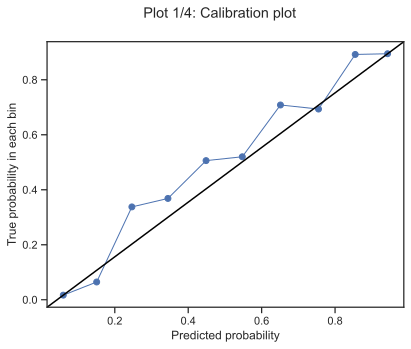

/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


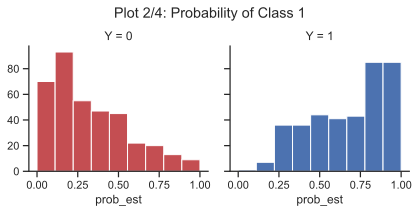

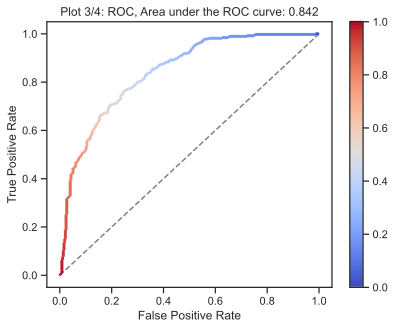

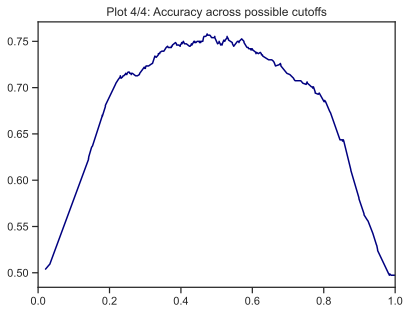

In [203]:
CT.plotClassPerformance(dfTR_eval_new['Y'], LogReg_fit.predict_proba(X_train_new[INPUTS_LR]), selClass=1)

# ESTE ULTIMO HA MEJORADO RESPECTO A LOS OTROS DOS, VOY A PROBARLO QUITANDOLE UNAS VARIABLES QUE NO SON RELEVANTES

In [214]:
#INPUTS = ['GLUCOSE','BODYMASSINDEX','PEDIGREEFUNC','AGE']
INPUTS = ['GLUCOSE','BLOODPRESS','BODYMASSINDEX','PEDIGREEFUNC','AGE']

OUTPUT = 'DIABETES'

X_new = diabetes_new[INPUTS]
y_new = diabetes_new[OUTPUT]


X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new,
                                                    test_size=0.2,  #percentage of test data 20%
                                                    random_state=0, #seed for replication, es para que me salga la =
                                                    stratify = y_new)   #Preserves distribution of y

In [215]:
## Create dataset to store model predictions for modificated dataset
dfTR_eval_new = X_train_new.copy()
dfTR_eval_new['Y'] = y_train_new # We will call Y as output variable for simplicity
dfTS_eval_new = X_test_new.copy()
dfTS_eval_new['Y'] = y_test_new # We will call Y as output variable for simplicity>

In [216]:
## Inputs of the model. Change accordingly to perform variable selection
INPUTS_LR = INPUTS

#ModLogReg = LogisticRegression()
LogReg_fit = Pipeline(steps=[('scaler',StandardScaler()), # Preprocess the variables when training the model 
                        ('LogReg',LogisticRegression(random_state=5))]) # Model to use in the pipeline

#Es como una tuberia, lo primero que va a hacer es un 'scaler' es una funcion que me escala las variables
#Lo que hace es normalizarlo, le quita la media y lo divide entre la varianza

#Train model
LogReg_fit.fit(X_train_new[INPUTS_LR], y_train_new);

print("Logistic Regression Trained")

Logistic Regression Trained


In [217]:
# Obtain Cross-Validation score
print("CV accuracy is")
cross_val_score(LogReg_fit, X_train_new[INPUTS_LR], y_train_new, cv=10, scoring='accuracy').mean()

CV accuracy is


0.7461052631578948

In [218]:
CT.summaryLogReg(LogReg_fit, X_train_new[INPUTS_LR], y_train_new) #Esto te da los resultados de los que hablabamos en casa

Deviance Residuals:
        Min        1Q    Median        3Q       Max
0 -0.990034 -0.288071  0.020403  0.271937  0.967321

Coefficients:
               Estimate
Intercept      0.043909
GLUCOSE        1.072006
BLOODPRESS    -0.249882
BODYMASSINDEX  0.724293
PEDIGREEFUNC   0.239348
AGE            0.471864
               Estimate  Std. Err   t-value      Pr(>|t|) Signif
Intercept      0.043909  0.089773  0.489105  6.247673e-01       
GLUCOSE        1.072006  0.110427  9.707806  0.000000e+00    ***
BLOODPRESS    -0.249882  0.102610 -2.435273  1.488057e-02      *
BODYMASSINDEX  0.724293  0.102807  7.045182  1.852296e-12    ***
PEDIGREEFUNC   0.239348  0.093540  2.558790  1.050372e-02      *
AGE            0.471864  0.099009  4.765871  1.880397e-06    ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


In [219]:
## Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval_new['Y_LR_pred'] = LogReg_fit.predict(X_train_new[INPUTS_LR])
dfTR_eval_new['Y_LR_prob_neg'] = LogReg_fit.predict_proba(X_train_new[INPUTS_LR])[:,0] #NO 
dfTR_eval_new['Y_LR_prob_pos'] = LogReg_fit.predict_proba(X_train_new[INPUTS_LR])[:,1] #YES
### Scale test using preprocess in training ---------------------------------------------
dfTS_eval_new['Y_LR_pred'] = LogReg_fit.predict(X_test_new)
dfTS_eval_new['Y_LR_prob_neg'] = LogReg_fit.predict_proba(X_test_new[INPUTS_LR])[:,0]
dfTS_eval_new['Y_LR_prob_pos'] = LogReg_fit.predict_proba(X_test_new[INPUTS_LR])[:,1]

In [220]:
#Confusion matrix for Log Reg Model
print("----- TRAINING CONFUSION MATRIX -----")
CT.confusion_matrix(dfTR_eval_new['Y'], dfTR_eval_new['Y_LR_pred'], labels=[0,1])

----- TRAINING CONFUSION MATRIX -----
Confusion Matrix and Statistics
	   Prediction
 Reference   0   1
         0 289  85
         1 103 275

Accuracy: 0.75
No Information Rate: 0.5
P-Value [Acc > NIR]: 0.0
Kappa: 0.5
Mcnemar's Test P-Value: 0.21
Sensitivity: 0.73
Specificity: 0.77
Pos pred value: 0.76
Neg pred value: 0.74
Prevalence: 0.5
Detection Rate: 0.37
Detection prevalence: 0.48
Balanced accuracy: 0.75
F Score: 0.75
Positive class: 1


In [221]:
print("----- TEST CONFUSION MATRIX-----")
CT.confusion_matrix(dfTS_eval_new['Y'], dfTS_eval_new['Y_LR_pred'], labels=[0,1])

----- TEST CONFUSION MATRIX-----
Confusion Matrix and Statistics
	   Prediction
 Reference  0  1
         0 71 23
         1 29 65

Accuracy: 0.72
No Information Rate: 0.5
P-Value [Acc > NIR]: 0.0
Kappa: 0.45
Mcnemar's Test P-Value: 0.49
Sensitivity: 0.69
Specificity: 0.76
Pos pred value: 0.74
Neg pred value: 0.71
Prevalence: 0.5
Detection Rate: 0.35
Detection prevalence: 0.47
Balanced accuracy: 0.72
F Score: 0.71
Positive class: 1


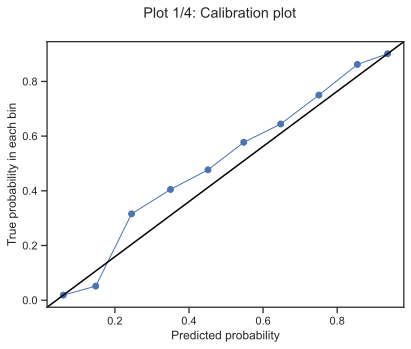

/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


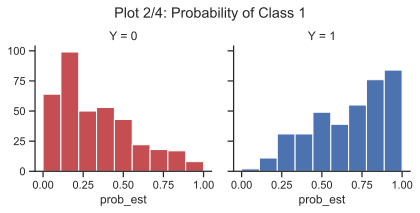

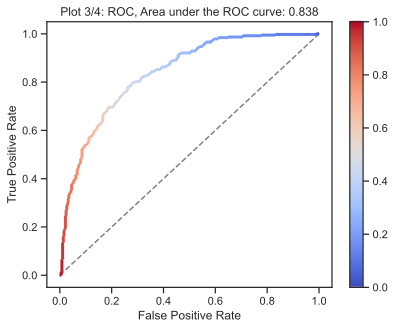

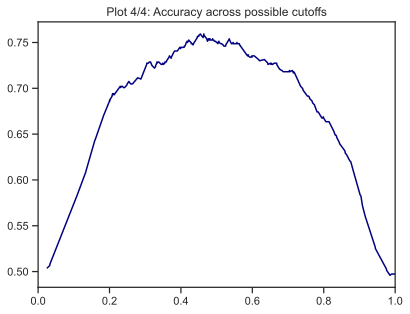

In [222]:
CT.plotClassPerformance(dfTR_eval_new['Y'], LogReg_fit.predict_proba(X_train_new[INPUTS_LR]), selClass=1)

### Support Vector Machines (SVM)

- [SVC()](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html?highlight=svc)
- [Wikipedia](https://en.wikipedia.org/wiki/Support-vector_machine)

Vamos a probar diferentes tipos de svm
+ LINEAL
+ POLINOMIAL
+ RADIAL

Los kernels Polinomial y Radial se utilizan cuando las clases no son linealmente separables, como hemos visto al pintar las gráficas de distribución de los datos, no lo son, por lo tanto usaremos estos dos tipos de kernels

Para diferentes datasets
+ Original
+ Limpio
+ Limpio con variables más significativas (segín el Random Forest)

#### En primer lugar probamos con el dataset completo

In [93]:
# Define input and output matrices
INPUTS = ['PREGNANT','GLUCOSE','BLOODPRESS','SKINTHICKNESS','INSULIN','BODYMASSINDEX','PEDIGREEFUNC','AGE']
OUTPUT = 'DIABETES'
X = diabetes[INPUTS]
y = diabetes[OUTPUT]

# Split original dataset 
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,  #percentage of test data 20%
                                                    random_state=0, #seed for replication, es para que me salga la =
                                                    stratify = y)   #Preserves distribution of y

In [94]:
## Create dataset to store model predictions
dfTR_eval = X_train.copy()
dfTR_eval['Y'] = y_train # We will call Y as output variable for simplicity
dfTS_eval = X_test.copy()
dfTS_eval['Y'] = y_test # We will call Y as output variable for simplicity

In [95]:
#-------------------------------------------------------------------------------------------------
#------------------------------- LINEAR SVM MODEL ------------------------------------------------
#-------------------------------------------------------------------------------------------------
## Inputs of the model. Change accordingly to perform variable selection
INPUTS_LSVC = INPUTS

param = {'SVC__C': [0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000]} # Cost term
pipe = Pipeline(steps=[ ('scaler', StandardScaler()), 
                        ('SVC',  SVC(kernel='linear', # lineal kernel
                                    probability=True, # let the model predict probabilities
                                    random_state=150))]) # For replication


# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 5
Linear_SVC_gcv = GridSearchCV(estimator=pipe, # Structure of the model to use
                        param_grid=param, # Defined grid to search in
                        n_jobs=-1, # Number of cores to use (parallelize)
                        scoring='accuracy', # Accuracy https://scikit-learn.org/stable/modules/model_evaluation.html
                        cv=nFolds) # Number of Folds 
Linear_SVC_gcv.fit(X_train[INPUTS_LSVC], y_train) # Search in grid

# We use Calibrated CV to transform predictions of the model to probabilities due to a known bug in scikit SVC
Linear_SVC_fit = CalibratedClassifierCV(
                        base_estimator=Linear_SVC_gcv, # Structure of the model to use
                        n_jobs=-1, # Number of cores to use (parallelize)
                        method='isotonic', # The method to use for calibration
                        cv=nFolds) # Number of Folds 
Linear_SVC_fit.fit(X_train[INPUTS_LSVC], y_train) # Search in grid

CalibratedClassifierCV(base_estimator=GridSearchCV(cv=5,
                                                   estimator=Pipeline(steps=[('scaler',
                                                                              StandardScaler()),
                                                                             ('SVC',
                                                                              SVC(kernel='linear',
                                                                                  probability=True,
                                                                                  random_state=150))]),
                                                   n_jobs=-1,
                                                   param_grid={'SVC__C': [1e-05,
                                                                          0.0001,
                                                                          0.001,
                                                                          0.01,
                                                                          0.1,
                                                                          1, 10,
                                                                          100,
                                                                          1000]},
                                                   scoring='accuracy'),
                       cv=5, method='isotonic', n_jobs=-1)

In [96]:
# Obtain Cross-Validation score
print("CV accuracy is")
cross_val_score(Linear_SVC_fit, X_train[INPUTS_LSVC], y_train, cv=10, scoring='accuracy').mean()

CV accuracy is


0.7670809095716553

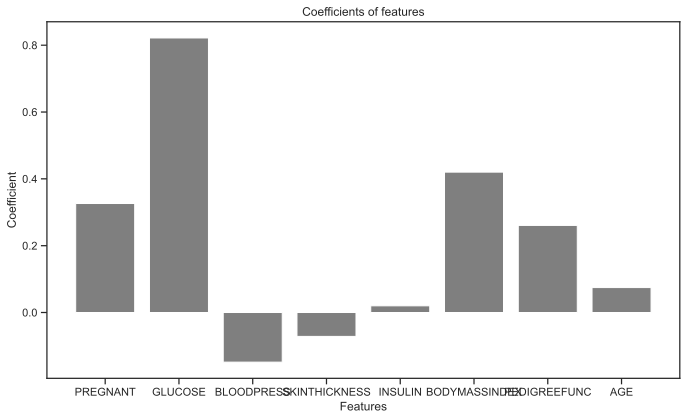

In [97]:
## Plot the variable coefficient of each feature
plt.figure(figsize=(6 * 1.618, 6))
index = np.arange(len(X_train[INPUTS_LSVC].columns))
bar_width = 0.35
plt.bar(index, Linear_SVC_fit.base_estimator.best_estimator_['SVC'].coef_[0,:], color='black', alpha=0.5)
plt.xlabel('Features')
plt.ylabel('Coefficient')
plt.title('Coefficients of features')
plt.xticks(index, X_train[INPUTS_LSVC].columns)
plt.tight_layout()
plt.show()

In [98]:
## Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval['Y_LSVC_pred'] = Linear_SVC_fit.predict(X_train[INPUTS_LSVC])
dfTR_eval['Y_LSVC_prob_neg'] = Linear_SVC_fit.predict_proba(X_train[INPUTS_LSVC])[:,0]
dfTR_eval['Y_LSVC_prob_pos'] = Linear_SVC_fit.predict_proba(X_train[INPUTS_LSVC])[:,1]
### Scale test using preprocess in training
dfTS_eval['Y_LSVC_pred'] = Linear_SVC_fit.predict(X_test[INPUTS_LSVC])
dfTS_eval['Y_LSVC_prob_neg'] = Linear_SVC_fit.predict_proba(X_test[INPUTS_LSVC])[:,0]
dfTS_eval['Y_LSVC_prob_pos'] = Linear_SVC_fit.predict_proba(X_test[INPUTS_LSVC])[:,1]

#visualize evaluated data
dfTR_eval.head()

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,Y,Y_LSVC_pred,Y_LSVC_prob_neg,Y_LSVC_prob_pos
22,7,196,90,0,0,39.8,0.451,41,1,1,0.051429,0.948571
497,2,81,72,15,76,30.1,0.547,25,0,0,0.971466,0.028534
395,2,127,58,24,275,27.7,1.600,25,0,1,0.445132,0.554868
381,0,105,68,22,0,20.0,0.236,22,0,0,0.976226,0.023774
258,1,193,50,16,375,25.9,0.655,24,0,1,0.291685,0.708315


In [99]:
CT.confusion_matrix(dfTR_eval['Y'], dfTR_eval['Y_LSVC_pred'], labels=[0,1])

Confusion Matrix and Statistics
	   Prediction
 Reference   0   1
         0 355  45
         1  89 125

Accuracy: 0.78
No Information Rate: 0.57
P-Value [Acc > NIR]: 0.0
Kappa: 0.5
Mcnemar's Test P-Value: 0.0
Sensitivity: 0.58
Specificity: 0.89
Pos pred value: 0.74
Neg pred value: 0.8
Prevalence: 0.35
Detection Rate: 0.2
Detection prevalence: 0.28
Balanced accuracy: 0.74
F Score: 0.65
Positive class: 1


In [100]:
CT.confusion_matrix(dfTS_eval['Y'], dfTS_eval['Y_LSVC_pred'], labels=[0,1])

Confusion Matrix and Statistics
	   Prediction
 Reference  0  1
         0 89 11
         1 23 31

Accuracy: 0.78
No Information Rate: 0.57
P-Value [Acc > NIR]: 0.0
Kappa: 0.49
Mcnemar's Test P-Value: 0.06
Sensitivity: 0.57
Specificity: 0.89
Pos pred value: 0.74
Neg pred value: 0.79
Prevalence: 0.35
Detection Rate: 0.2
Detection prevalence: 0.27
Balanced accuracy: 0.73
F Score: 0.65
Positive class: 1


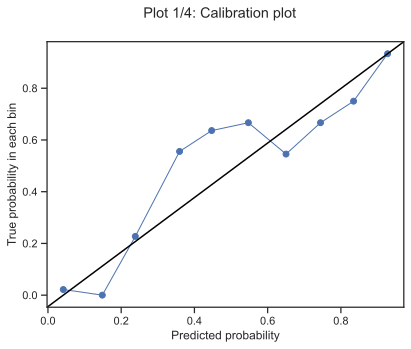

/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


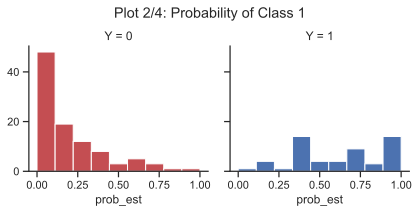

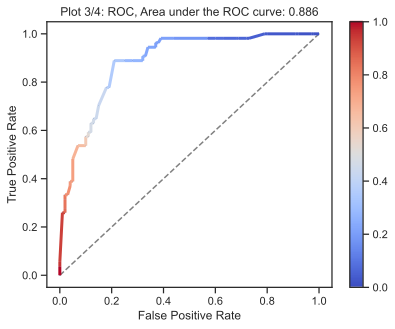

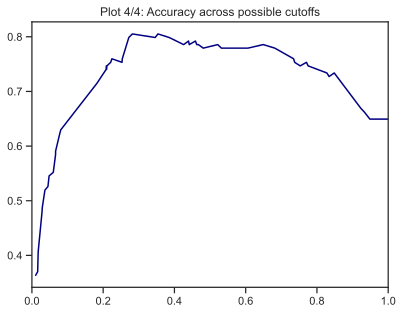

In [101]:
CT.plotClassPerformance(dfTS_eval['Y'], Linear_SVC_fit.predict_proba(X_test[INPUTS_LSVC]), selClass=1)

In [102]:
#-------------------------------------------------------------------------------------------------
#------------------------------- POLYNOMIAL SVM MODEL ------------------------------------------------
#-------------------------------------------------------------------------------------------------
## Inputs of the model. Change accordingly to perform variable selection
INPUTS_PSVC = INPUTS
## Train model -----------------------------------------------------------------------------------
param = {'SVC__C': [0.001,0.01,0.1,1,10], # Cost term
         'SVC__gamma':[0.0001,0.001,0.01,0.1,1]} # Inverse width parameter in the Gaussian Radial Basis kernel 

pipe = Pipeline(steps=[('scaler', StandardScaler()), 
                       ('SVC', SVC(kernel='poly', # polynomial kernel
                                   degree=8,# funcion polinomial cuadratica
                                   probability=True, # let the model predict probabilities
                                   random_state=150))]) # For replication

# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 5
PSVC_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='accuracy', # Accuracy https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
PSVC_fit.fit(X_train[INPUTS_PSVC], y_train) # Search in grid

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('SVC',
                                        SVC(degree=8, kernel='poly',
                                            probability=True,
                                            random_state=150))]),
             n_jobs=-1,
             param_grid={'SVC__C': [0.001, 0.01, 0.1, 1, 10],
                         'SVC__gamma': [0.0001, 0.001, 0.01, 0.1, 1]},
             scoring='accuracy')

In [103]:
# Obtain Cross-Validation score
print("CV accuracy is")
cross_val_score(PSVC_fit, X_train[INPUTS_PSVC], y_train, cv=10, scoring='accuracy').mean()

CV accuracy is


0.6906134320465361

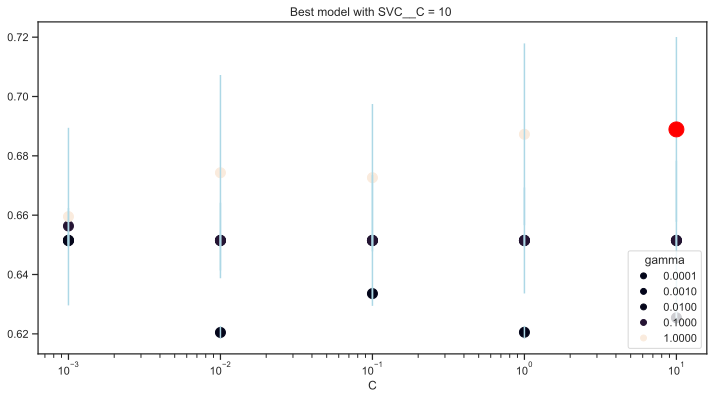

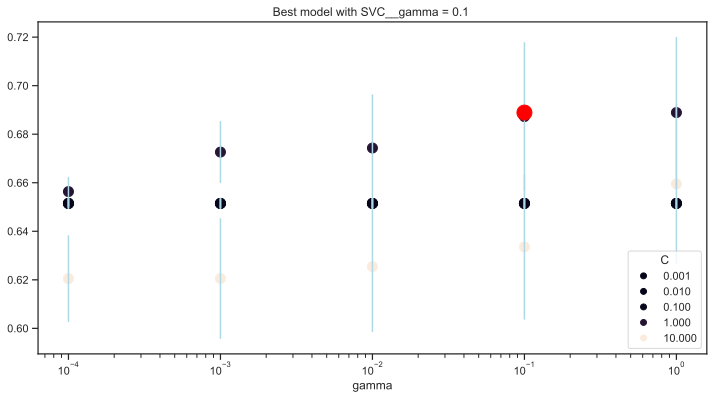

In [104]:
MT.plotModelGridError(PSVC_fit, xscale="log", xscale2='log')

In [105]:
## Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval['Y_PSVC_pred'] = PSVC_fit.predict(X_train[INPUTS_PSVC])
dfTR_eval['Y_PSVC_prob_neg'] = PSVC_fit.predict_proba(X_train[INPUTS_PSVC])[:,0]
dfTR_eval['Y_PSVC_prob_pos'] = PSVC_fit.predict_proba(X_train[INPUTS_PSVC])[:,1]
### Scale test using preprocess in training
dfTS_eval['Y_PSVC_pred'] = PSVC_fit.predict(X_test[INPUTS_PSVC])
dfTS_eval['Y_PSVC_prob_neg'] = PSVC_fit.predict_proba(X_test[INPUTS_PSVC])[:,0]
dfTS_eval['Y_PSVC_prob_pos'] = PSVC_fit.predict_proba(X_test[INPUTS_PSVC])[:,1]

#visualize evaluated data
dfTR_eval.head()

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,Y,Y_LSVC_pred,Y_LSVC_prob_neg,Y_LSVC_prob_pos,Y_PSVC_pred,Y_PSVC_prob_neg,Y_PSVC_prob_pos
22,7,196,90,0,0,39.8,0.451,41,1,1,0.051429,0.948571,1,0.649544,0.350456
497,2,81,72,15,76,30.1,0.547,25,0,0,0.971466,0.028534,0,0.649829,0.350171
395,2,127,58,24,275,27.7,1.600,25,0,1,0.445132,0.554868,0,0.649829,0.350171
381,0,105,68,22,0,20.0,0.236,22,0,0,0.976226,0.023774,0,0.649831,0.350169
258,1,193,50,16,375,25.9,0.655,24,0,1,0.291685,0.708315,0,0.649829,0.350171


In [106]:
#Confusion matrix for SVC Linear Model
print("----- TRAINING CONFUSION MATRIX -----")
CT.confusion_matrix(dfTR_eval['Y'], dfTR_eval['Y_PSVC_pred'], labels=[0,1])

----- TRAINING CONFUSION MATRIX -----
Confusion Matrix and Statistics
	   Prediction
 Reference   0   1
         0 400   0
         1 107 107

Accuracy: 0.83
No Information Rate: 0.6
P-Value [Acc > NIR]: 0.0
Kappa: 0.57
Mcnemar's Test P-Value: 0.0
Sensitivity: 0.5
Specificity: 1.0
Pos pred value: 1.0
Neg pred value: 0.79
Prevalence: 0.35
Detection Rate: 0.17
Detection prevalence: 0.17
Balanced accuracy: 0.75
F Score: 0.67
Positive class: 1


In [107]:
#Es muy importante comparar el train como el test, ya donde tienen que ser lo mas similares posibles
print("----- TEST CONFUSION MATRIX-----")
CT.confusion_matrix(dfTS_eval['Y'], dfTS_eval['Y_PSVC_pred'], labels=[0,1])

----- TEST CONFUSION MATRIX-----
Confusion Matrix and Statistics
	   Prediction
 Reference  0  1
         0 97  3
         1 38 16

Accuracy: 0.73
No Information Rate: 0.61
P-Value [Acc > NIR]: 0.02
Kappa: 0.31
Mcnemar's Test P-Value: 0.0
Sensitivity: 0.3
Specificity: 0.97
Pos pred value: 0.84
Neg pred value: 0.72
Prevalence: 0.35
Detection Rate: 0.1
Detection prevalence: 0.12
Balanced accuracy: 0.63
F Score: 0.44
Positive class: 1


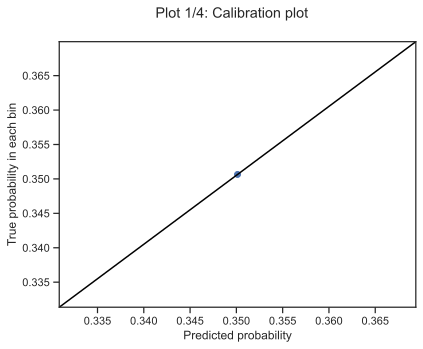

/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/opt/homebrew/Caskroom/miniforge/base/envs/fmad/lib/python3.10/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


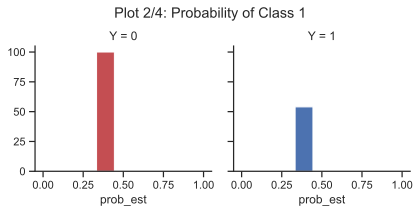

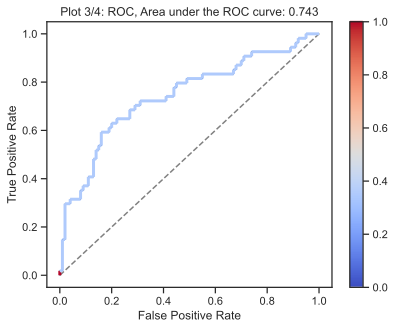

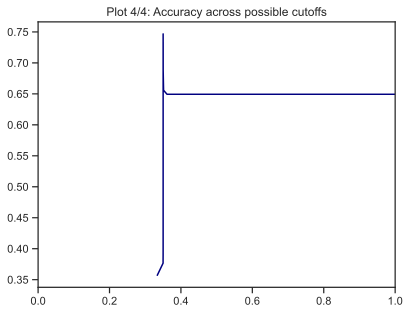

In [108]:
CT.plotClassPerformance(dfTS_eval['Y'], PSVC_fit.predict_proba(X_test[INPUTS_PSVC]), selClass=1)

#### Ahora, probamos con el mismo dataset pero con el kernel radial


In [109]:
#-------------------------------------------------------------------------------------------------
#------------------------------- RADIAL SVM MODEL ------------------------------------------------
#-------------------------------------------------------------------------------------------------
# mismo dataset que antes, pero con kernel radial
## Inputs of the model. Change accordingly to perform variable selection
INPUTS_RSVC = INPUTS
## Train model -----------------------------------------------------------------------------------
param = {'SVC__C': [0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000], # Cost term
         'SVC__gamma':[0.0001,0.001,0.01,0.1,1,10]} # Inverse width parameter in the Gaussian Radial Basis kernel 
pipe = Pipeline(steps=[('scaler', StandardScaler()), 
                       ('SVC', SVC(kernel='rbf', # gausian kernel
                                   probability=True, # let the model predict probabilities
                                   random_state=150))]) # For replication

# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
SVC_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='accuracy', # Accuracy https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
SVC_fit.fit(X_train[INPUTS_RSVC], y_train) # Search in grid

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('SVC',
                                        SVC(probability=True,
                                            random_state=150))]),
             n_jobs=-1,
             param_grid={'SVC__C': [1e-05, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100,
                                    1000],
                         'SVC__gamma': [0.0001, 0.001, 0.01, 0.1, 1, 10]},
             scoring='accuracy')

In [110]:
# Obtain Cross-Validation score
print("CV accuracy is")
cross_val_score(SVC_fit, X_train[INPUTS_RSVC], y_train, cv=10, scoring='accuracy').mean()

CV accuracy is


KeyboardInterrupt: 

In [ ]:
MT.plotModelGridError(SVC_fit, xscale="log", xscale2='log')

In [ ]:
## Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval['Y_SVC_pred'] = SVC_fit.predict(X_train[INPUTS_RSVC])
dfTR_eval['Y_SVC_prob_neg'] = SVC_fit.predict_proba(X_train[INPUTS_RSVC])[:,0]
dfTR_eval['Y_SVC_prob_pos'] = SVC_fit.predict_proba(X_train[INPUTS_RSVC])[:,1]
### Scale test using preprocess in training
dfTS_eval['Y_SVC_pred'] = SVC_fit.predict(X_test[INPUTS_RSVC])
dfTS_eval['Y_SVC_prob_neg'] = SVC_fit.predict_proba(X_test[INPUTS_RSVC])[:,0]
dfTS_eval['Y_SVC_prob_pos'] = SVC_fit.predict_proba(X_test[INPUTS_RSVC])[:,1]

dfTR_eval.head()

In [ ]:
print("----- TRAINING CONFUSION MATRIX -----")
CT.confusion_matrix(dfTR_eval['Y'], dfTR_eval['Y_SVC_pred'], labels=[0,1])

In [ ]:
print("----- TEST CONFUSION MATRIX -----")
CT.confusion_matrix(dfTS_eval['Y'], dfTS_eval['Y_SVC_pred'], labels=[0,1])

Entre ambos modelos, entrenados con el mismo dataset, y configurados con los mismos parámetros, podemos ver que a penas hay diferencia. El accuracy de test en el modelo lineal nos sale `0.78`, mientras que en el modelo radial nos sale `0.78`.  

Vamos a entrenar los mismos modelos ahora, solo que esta vez con un dataset diferente. Usaremos el dataset limpio, sin outliers y con las clases balanceadas, para comprobar si el modelo mejora.

In [ ]:
# Define input and output matrices
INPUTS = ['PREGNANT','GLUCOSE','BLOODPRESS','SKINTHICKNESS','INSULIN','BODYMASSINDEX','PEDIGREEFUNC','AGE']
OUTPUT = 'DIABETES'

X_new = diabetes_new[INPUTS]
y_new = diabetes_new[OUTPUT]

# Split  modificated dataset
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new,
                                                    test_size=0.2,  #percentage of test data 20%
                                                    random_state=0, #seed for replication, es para que me salga la =
                                                    stratify = y_new)   #Preserves distribution of y

## Create dataset to store model predictions for modificated dataset
dfTR_eval_new = X_train_new.copy()
dfTR_eval_new['Y'] = y_train_new # We will call Y as output variable for simplicity
dfTS_eval_new = X_test_new.copy()
dfTS_eval_new['Y'] = y_test_new # We will call Y as output variable for simplicity

---
# Compare models
#### Podemos comparar todos los modelos utilizados, segun el dataset, para ver cuáles de ellos y con qué datos nos dan mejores resultados

In [ ]:
## Compare models
metric = 'Accuracy'
score = {'Linear SVC': cross_val_score(Linear_SVC_fit, X_train[INPUTS_LSVC], y_train, cv=10, scoring='accuracy'), 
         'Polynomial(2) SVC': cross_val_score(PSVC_fit, X_train[INPUTS_PSVC], y_train, cv=5, scoring='accuracy'), 
         'Radial SVC': cross_val_score(SVC_fit, X_train[INPUTS_RSVC], y_train, cv=10, scoring='accuracy')}
MT.dotplot(score, metric)

In [ ]:
CT.calibration_plot(y_test, dfTS_eval[['Y_LSVC_prob_pos','Y_SVC_prob_pos']])

In [ ]:
CT.roc_curve(y_test,dfTS_eval[['Y_LSVC_prob_pos','Y_SVC_prob_pos']], 1)